In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import pydicom
import cv2
import numpy as np
import os
from pathlib import Path
import warnings
from typing import List, Dict, Tuple

# Data Visualization

I adapted and restructured some code from the https://www.kaggle.com/code/abhinavsuri/anatomy-image-visualization-overview-rsna-raids while adding more comprehensive visualization and analysis capabilities in data visualization task. 

In [2]:
def main():
    """Main function for data exploration and visualization"""
    # Set up paths
    base_path = '/kaggle/input/rsna-2024-lumbar-spine-degenerative-classification'
    train_path = f"{base_path}/train_images"
    
    # Load metadata
    train_df = pd.read_csv(f"{base_path}/train.csv")
    coordinates_df = pd.read_csv(f"{base_path}/train_label_coordinates.csv")
    series_desc_df = pd.read_csv(f"{base_path}/train_series_descriptions.csv")
    
    # Print basic dataset information
    print_dataset_stats(train_df)
    
    # Visualize distribution of conditions
    plot_condition_distributions(train_df)
    
    # Example: Load and display images for one patient
    example_patient_id = train_df['study_id'].iloc[0]
    patient_images = load_patient_images(example_patient_id, train_path, series_desc_df)
    visualize_patient_images(patient_images)
    
    # Show pathology locations for the example patient
    show_pathology_locations(example_patient_id, patient_images, coordinates_df, train_df)


In [3]:
def print_dataset_stats(train_df: pd.DataFrame) -> None:
    """Print basic statistics about the dataset"""
    print(f"Total number of cases: {len(train_df)}")
    print("\nColumns in dataset:")
    for col in train_df.columns:
        print(f"- {col}")
    
    # Count conditions by type
    condition_types = ['foraminal', 'subarticular', 'canal']
    print("\nCondition counts:")
    for condition in condition_types:
        cols = [col for col in train_df.columns if condition in col]
        total_cases = train_df[cols].notna().sum().sum()
        print(f"{condition}: {total_cases} annotations")

In [4]:
def plot_condition_distributions(train_df: pd.DataFrame) -> None:
    """Plot distribution of different conditions"""
    condition_types = ['foraminal', 'subarticular', 'canal']
    
    fig, axes = plt.subplots(1, 3, figsize=(20, 5))
    
    for idx, condition in enumerate(condition_types):
        # Get columns for this condition
        condition_cols = [col for col in train_df.columns if condition in col]
        condition_data = train_df[condition_cols]
        
        # Count value distributions
        with warnings.catch_warnings():
            warnings.simplefilter(action='ignore', category=FutureWarning)
            value_counts = condition_data.apply(pd.value_counts).fillna(0).T
        
        # Plot
        value_counts.plot(kind='bar', stacked=True, ax=axes[idx])
        axes[idx].set_title(f'{condition} Distribution')
        axes[idx].set_xlabel('Vertebral Level')
        axes[idx].set_ylabel('Count')
        plt.xticks(rotation=45)
    
    plt.tight_layout()
    plt.show()


In [5]:
def load_patient_images(study_id: int, base_path: str, series_desc_df: pd.DataFrame) -> Dict:
    """Load all images for a single patient"""
    study_path = Path(base_path) / str(study_id)
    
    image_data = {}
    for series_id in os.listdir(study_path):
        if series_id.startswith('.'):
            continue
            
        # Get series description
        series_desc = series_desc_df[
            (series_desc_df['study_id'] == study_id) & 
            (series_desc_df['series_id'] == int(series_id))
        ]['series_description'].iloc[0]
        
        # Load all DICOM images in this series
        series_path = study_path / series_id
        image_data[series_id] = {
            'description': series_desc,
            'images': []
        }
        
        for dcm_file in sorted(os.listdir(series_path)):
            if dcm_file.endswith('.dcm'):
                dcm_path = series_path / dcm_file
                dcm = pydicom.dcmread(str(dcm_path))
                image_data[series_id]['images'].append({
                    'instance_number': dcm_file.replace('.dcm', ''),
                    'dicom': dcm
                })
    
    return image_data

In [6]:
def visualize_patient_images(image_data: Dict) -> None:
    """Display all images for a patient organized by series"""
    for series_id, series_data in image_data.items():
        images = [img['dicom'].pixel_array for img in series_data['images']]
        
        # Calculate grid dimensions
        n_images = len(images)
        n_cols = min(4, n_images)
        n_rows = (n_images + n_cols - 1) // n_cols
        
        # Create subplot grid
        fig, axes = plt.subplots(n_rows, n_cols, figsize=(15, 3*n_rows))
        fig.suptitle(f"Series: {series_data['description']}")
        
        if n_rows == 1:
            axes = [axes]
        
        # Plot each image
        for idx, img in enumerate(images):
            row = idx // n_cols
            col = idx % n_cols
            axes[row][col].imshow(img, cmap='gray')
            axes[row][col].axis('off')
            axes[row][col].set_title(f"Image {idx+1}")
        
        # Turn off empty subplots
        for idx in range(len(images), n_rows * n_cols):
            row = idx // n_cols
            col = idx % n_cols
            axes[row][col].axis('off')
        
        plt.tight_layout()
        plt.show()


In [7]:
def show_pathology_locations(
    study_id: int, 
    image_data: Dict, 
    coordinates_df: pd.DataFrame,
    train_df: pd.DataFrame
) -> None:
    """Display images with annotated pathology locations"""
    # Get coordinates for this study
    study_coords = coordinates_df[coordinates_df['study_id'] == study_id]
    
    # Get conditions for this study
    study_conditions = train_df[train_df['study_id'] == study_id]
    
    for _, coord in study_coords.iterrows():
        series_id = str(coord['series_id'])
        instance_num = str(coord['instance_number'])
        
        # Find the corresponding image
        for img in image_data[series_id]['images']:
            if img['instance_number'] == instance_num:
                # Create a copy of the image for annotation
                pixel_array = img['dicom'].pixel_array
                normalized_img = cv2.normalize(
                    pixel_array, 
                    None, 
                    alpha=0,
                    beta=255, 
                    norm_type=cv2.NORM_MINMAX, 
                    dtype=cv2.CV_8U
                )
                
                # Draw circle at pathology location
                annotated_img = cv2.circle(
                    normalized_img.copy(),
                    (int(coord['x']), int(coord['y'])),
                    radius=10,
                    color=(255, 0, 0),
                    thickness=2
                )
                
                # Get severity for this condition/level
                condition_col = f"{coord['condition'].lower().replace(' ', '_')}_{coord['level'].lower().replace('/', '_')}"
                severity = study_conditions[condition_col].iloc[0] if condition_col in study_conditions else "Unknown"
                
                # Display image
                plt.figure(figsize=(8, 8))
                plt.imshow(annotated_img, cmap='gray')
                plt.title(f"Level: {coord['level']}\nCondition: {coord['condition']}\nSeverity: {severity}")
                plt.axis('off')
                plt.show()


Total number of cases: 1975

Columns in dataset:
- study_id
- spinal_canal_stenosis_l1_l2
- spinal_canal_stenosis_l2_l3
- spinal_canal_stenosis_l3_l4
- spinal_canal_stenosis_l4_l5
- spinal_canal_stenosis_l5_s1
- left_neural_foraminal_narrowing_l1_l2
- left_neural_foraminal_narrowing_l2_l3
- left_neural_foraminal_narrowing_l3_l4
- left_neural_foraminal_narrowing_l4_l5
- left_neural_foraminal_narrowing_l5_s1
- right_neural_foraminal_narrowing_l1_l2
- right_neural_foraminal_narrowing_l2_l3
- right_neural_foraminal_narrowing_l3_l4
- right_neural_foraminal_narrowing_l4_l5
- right_neural_foraminal_narrowing_l5_s1
- left_subarticular_stenosis_l1_l2
- left_subarticular_stenosis_l2_l3
- left_subarticular_stenosis_l3_l4
- left_subarticular_stenosis_l4_l5
- left_subarticular_stenosis_l5_s1
- right_subarticular_stenosis_l1_l2
- right_subarticular_stenosis_l2_l3
- right_subarticular_stenosis_l3_l4
- right_subarticular_stenosis_l4_l5
- right_subarticular_stenosis_l5_s1

Condition counts:
foraminal: 

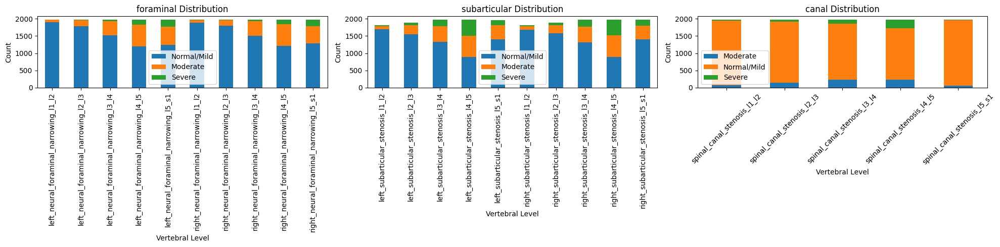

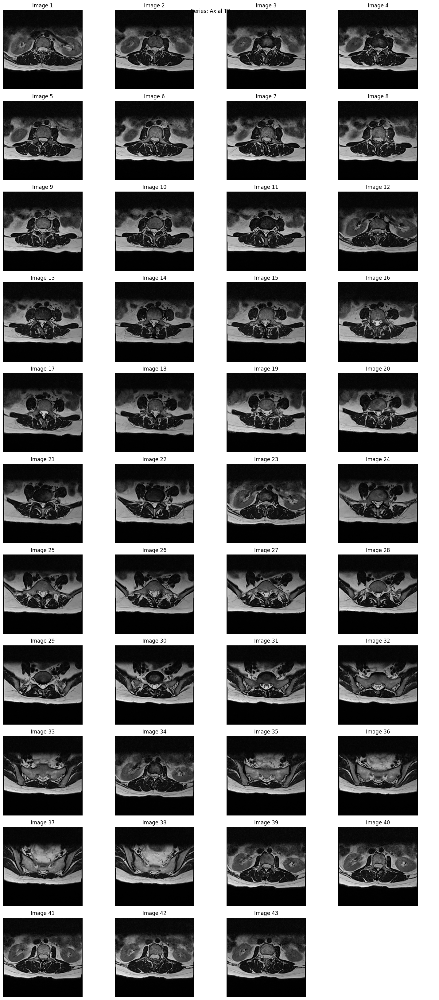

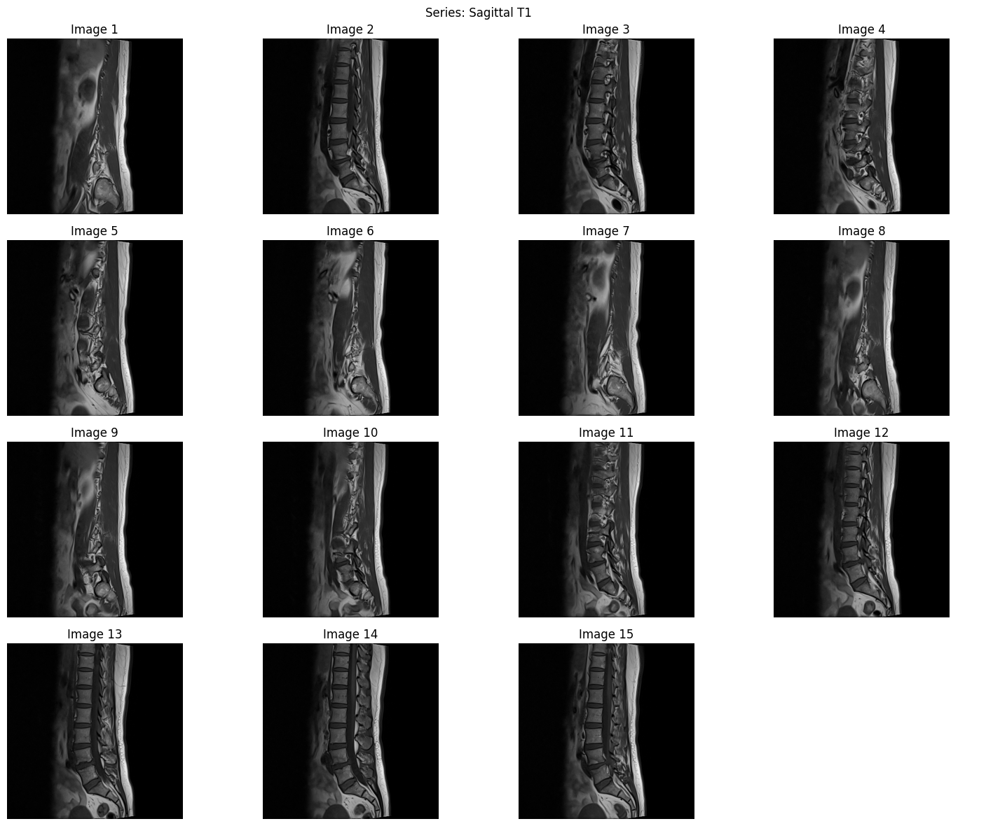

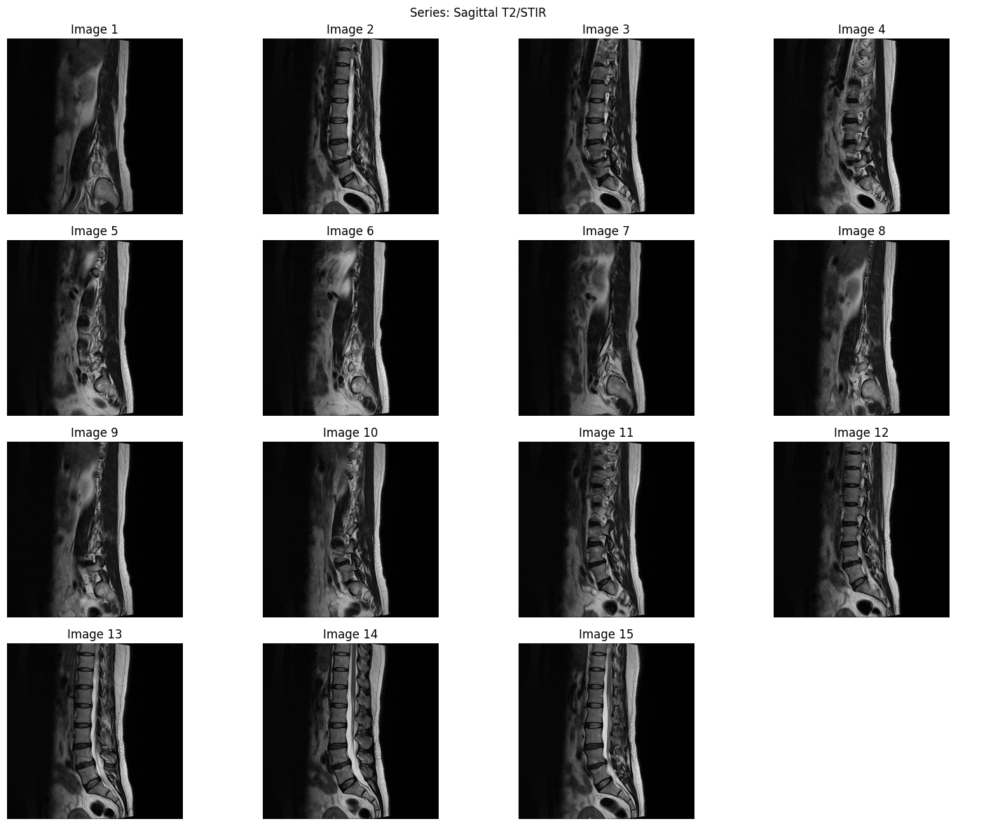

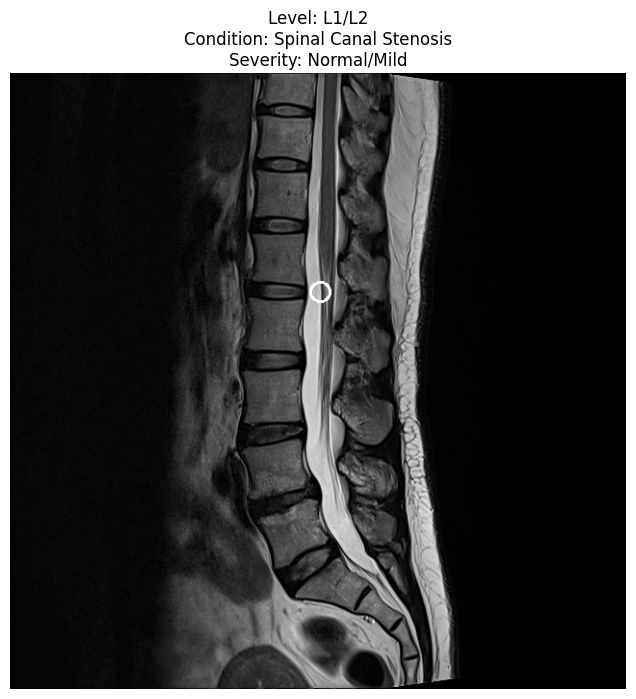

...

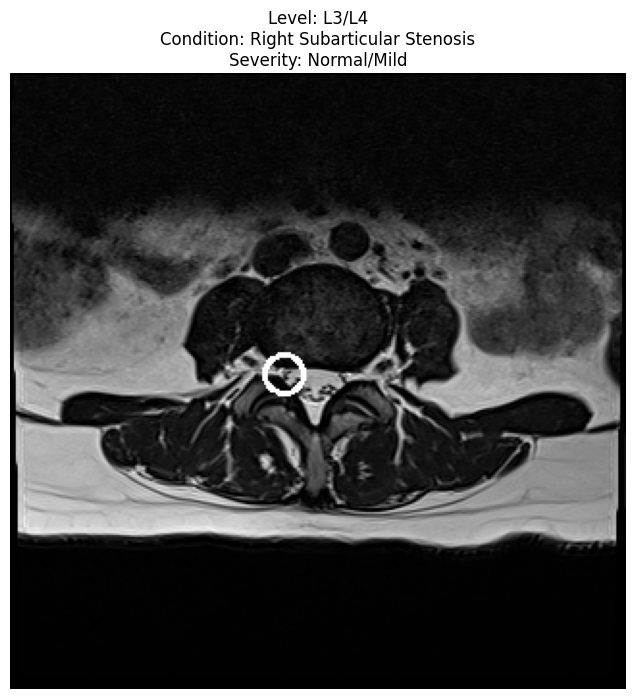

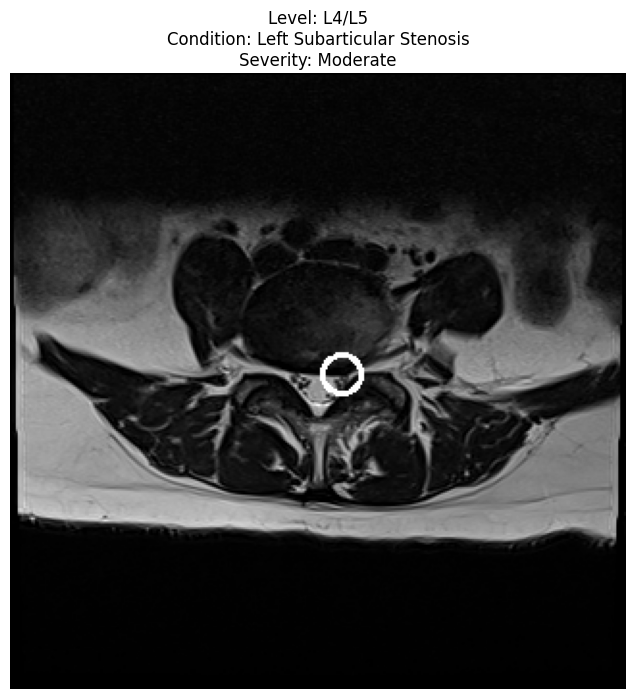

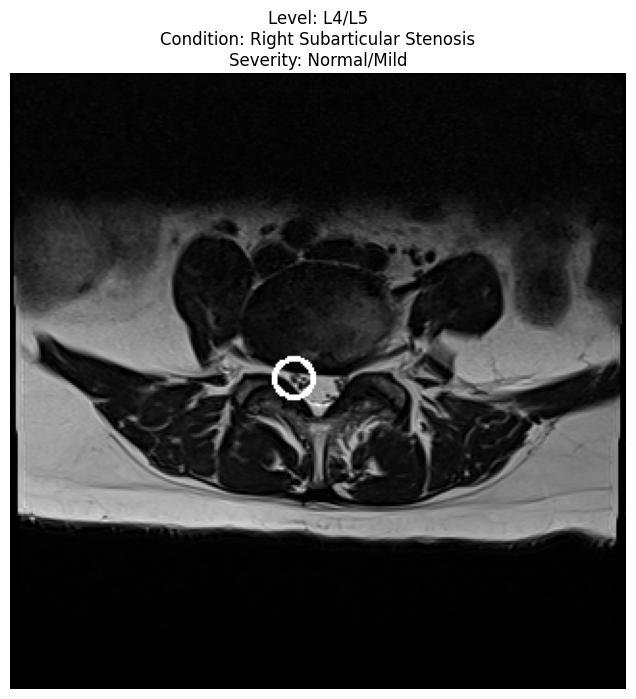

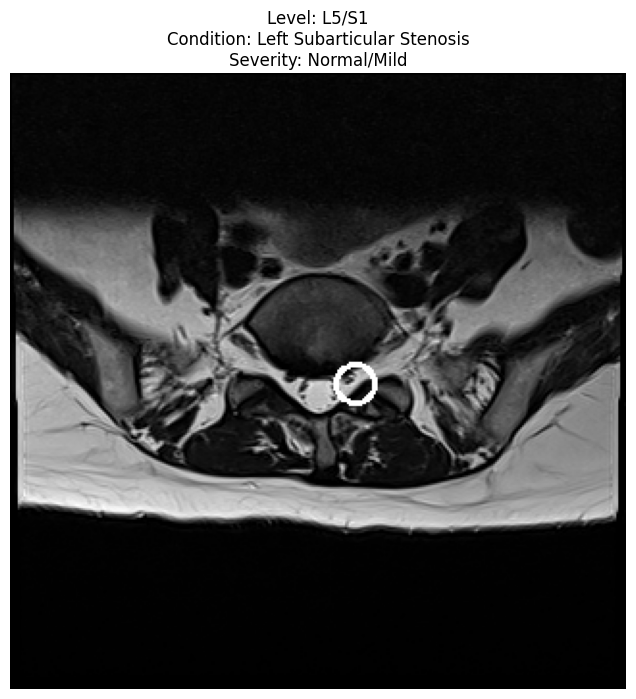

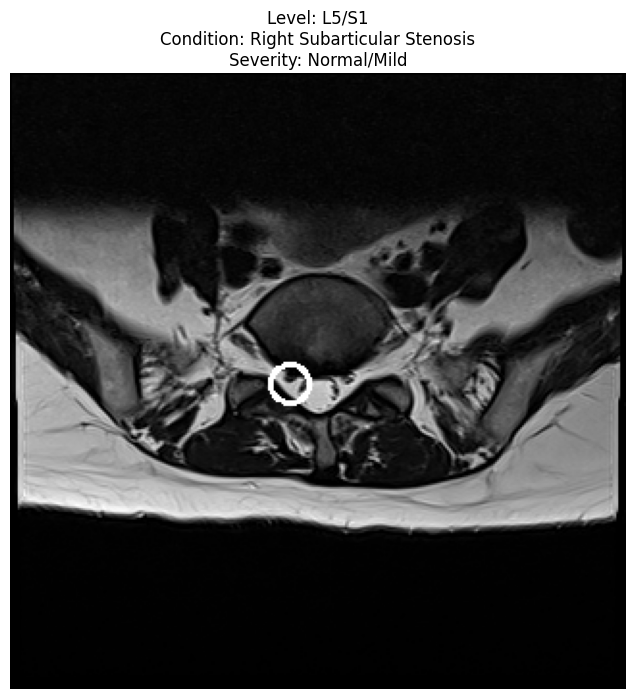

In [8]:
if __name__ == "__main__":
    main()

# Pattern Analysis

Analyze four key aspects of the data:

1. Class distributions: Understanding how severity levels are distributed across conditions
2. Condition co-occurrence: Analyzing how different conditions appear together
3. Level patterns: Understanding how conditions vary across vertebral levels
4. Series patterns: Analyzing the relationship between image series types and conditions

Generate visualizations and print detailed statistics about patterns in the data. This will help us:

1. Identify class imbalances
2. Understand which conditions tend to occur together
3. See if certain vertebral levels are more prone to specific conditions
4. Determine which image series are most useful for detecting each condition

In [9]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
from pathlib import Path
import warnings
warnings.filterwarnings('ignore')

In [10]:
def main():
    """Main function for analyzing patterns in the lumbar spine data"""
    base_path = '/kaggle/input/rsna-2024-lumbar-spine-degenerative-classification'
    
    # Load necessary data
    train_df = pd.read_csv(f"{base_path}/train.csv")
    coords_df = pd.read_csv(f"{base_path}/train_label_coordinates.csv")
    series_df = pd.read_csv(f"{base_path}/train_series_descriptions.csv")
    
    # Analyze patterns
    print("1. Analyzing class distribution patterns...")
    analyze_class_distributions(train_df)
    
    print("\n2. Analyzing condition co-occurrence...")
    analyze_condition_cooccurrence(train_df)
    
    print("\n3. Analyzing condition patterns across vertebral levels...")
    analyze_level_patterns(train_df)
    
    print("\n4. Analyzing series descriptions and their relationships to conditions...")
    analyze_series_patterns(series_df, coords_df)


In [11]:
def analyze_class_distributions(train_df):
    """Analyze the distribution of severity classes across different conditions"""
    # Get condition columns
    condition_cols = [col for col in train_df.columns 
                     if any(cond in col for cond in ['foraminal', 'subarticular', 'canal'])]
    
    # Create figure for distribution plots
    plt.figure(figsize=(15, 8))
    severity_counts = {}
    
    # Count severity distributions for each condition type
    for col in condition_cols:
        severity_counts[col] = train_df[col].value_counts()
    
    # Convert to DataFrame for easier plotting
    severity_df = pd.DataFrame(severity_counts).fillna(0)
    
    # Plot overall severity distribution
    severity_df.transpose().plot(kind='bar', stacked=True)
    plt.title('Severity Distribution Across All Conditions and Levels')
    plt.xlabel('Condition and Level')
    plt.ylabel('Count')
    plt.xticks(rotation=45, ha='right')
    plt.tight_layout()
    plt.show()
    
    # Print summary statistics
    print("\nSeverity Distribution Summary:")
    total_annotations = severity_df.sum().sum()
    for severity in ['Normal/Mild', 'Moderate', 'Severe']:
        count = severity_df.loc[severity].sum()
        percentage = (count/total_annotations) * 100
        print(f"{severity}: {count:.0f} cases ({percentage:.1f}%)")


In [12]:
def analyze_condition_cooccurrence(train_df):
    """Analyze how different conditions co-occur"""
    # Create separate DataFrames for each condition type
    conditions = {
        'canal': [col for col in train_df.columns if 'canal' in col],
        'foraminal': [col for col in train_df.columns if 'foraminal' in col],
        'subarticular': [col for col in train_df.columns if 'subarticular' in col]
    }
    
    # Create co-occurrence matrix
    plt.figure(figsize=(12, 8))
    cooccurrence_matrix = np.zeros((3, 3))
    condition_types = list(conditions.keys())
    
    for i, cond1 in enumerate(condition_types):
        for j, cond2 in enumerate(condition_types):
            # Count cases where both conditions are severe
            severe_cases1 = train_df[conditions[cond1]] == 'Severe'
            severe_cases2 = train_df[conditions[cond2]] == 'Severe'
            cooccurrence = (severe_cases1.any(axis=1) & severe_cases2.any(axis=1)).sum()
            cooccurrence_matrix[i, j] = cooccurrence
    
    # Plot co-occurrence heatmap
    sns.heatmap(cooccurrence_matrix, 
                annot=True, 
                fmt='g',
                xticklabels=condition_types,
                yticklabels=condition_types)
    plt.title('Co-occurrence of Severe Cases Between Conditions')
    plt.tight_layout()
    plt.show()
    
    print("\nKey Co-occurrence Patterns:")
    for i, cond1 in enumerate(condition_types):
        for j, cond2 in enumerate(condition_types):
            if i < j:
                print(f"{cond1.capitalize()} + {cond2.capitalize()}: {cooccurrence_matrix[i,j]:.0f} severe cases")


In [13]:
def analyze_level_patterns(train_df):
    """Analyze patterns across vertebral levels"""
    levels = ['l1_l2', 'l2_l3', 'l3_l4', 'l4_l5', 'l5_s1']
    conditions = ['canal', 'foraminal', 'subarticular']
    
    plt.figure(figsize=(15, 6))
    
    # Create matrix of severity by level
    level_severity = np.zeros((len(conditions), len(levels)))
    
    for i, condition in enumerate(conditions):
        for j, level in enumerate(levels):
            # Get columns for this condition and level
            cols = [col for col in train_df.columns if condition in col and level in col]
            # Calculate percentage of severe cases
            severe_cases = (train_df[cols] == 'Severe').sum().sum()
            total_cases = train_df[cols].notna().sum().sum()
            level_severity[i, j] = (severe_cases / total_cases * 100) if total_cases > 0 else 0
    
    # Plot level severity patterns
    sns.heatmap(level_severity,
                annot=True,
                fmt='.1f',
                xticklabels=levels,
                yticklabels=conditions,
                cmap='YlOrRd')
    plt.title('Percentage of Severe Cases by Level and Condition')
    plt.xlabel('Vertebral Level')
    plt.ylabel('Condition Type')
    plt.tight_layout()
    plt.show()
    
    print("\nLevel-wise Pattern Summary:")
    for condition in conditions:
        print(f"\n{condition.capitalize()} patterns:")
        for level in levels:
            cols = [col for col in train_df.columns if condition in col and level in col]
            severe_count = (train_df[cols] == 'Severe').sum().sum()
            total_count = train_df[cols].notna().sum().sum()
            if total_count > 0:
                percentage = (severe_count / total_count) * 100
                print(f"  {level}: {percentage:.1f}% severe cases")


In [14]:
def analyze_series_patterns(series_df, coords_df):
    """Analyze patterns in series descriptions and their relationship to conditions"""
    # Count series descriptions
    series_counts = series_df['series_description'].value_counts()
    
    plt.figure(figsize=(12, 6))
    series_counts.plot(kind='bar')
    plt.title('Distribution of Series Types')
    plt.xlabel('Series Description')
    plt.ylabel('Count')
    plt.xticks(rotation=45, ha='right')
    plt.tight_layout()
    plt.show()
    
    # Analyze which series types are used for different conditions
    condition_series = coords_df.merge(series_df, 
                                     left_on=['study_id', 'series_id'],
                                     right_on=['study_id', 'series_id'])
    
    print("\nSeries Usage by Condition:")
    for condition in condition_series['condition'].unique():
        print(f"\n{condition}:")
        series_for_condition = condition_series[
            condition_series['condition'] == condition
        ]['series_description'].value_counts()
        
        for series_type, count in series_for_condition.items():
            print(f"  {series_type}: {count} annotations")

1. Analyzing class distribution patterns...


<Figure size 1500x800 with 0 Axes>

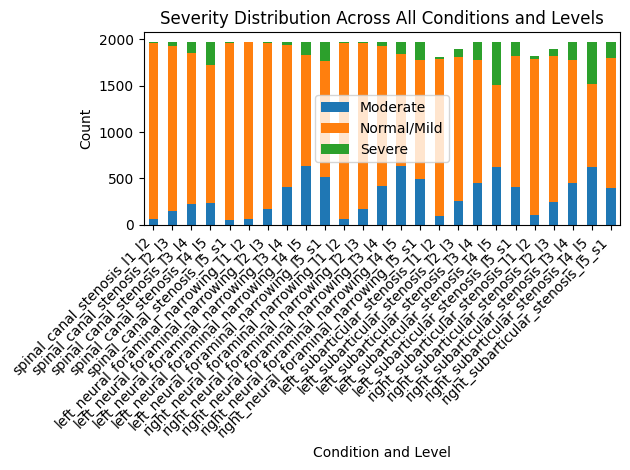


Severity Distribution Summary:
Normal/Mild: 37754 cases (77.4%)
Moderate: 7960 cases (16.3%)
Severe: 3089 cases (6.3%)

2. Analyzing condition co-occurrence...


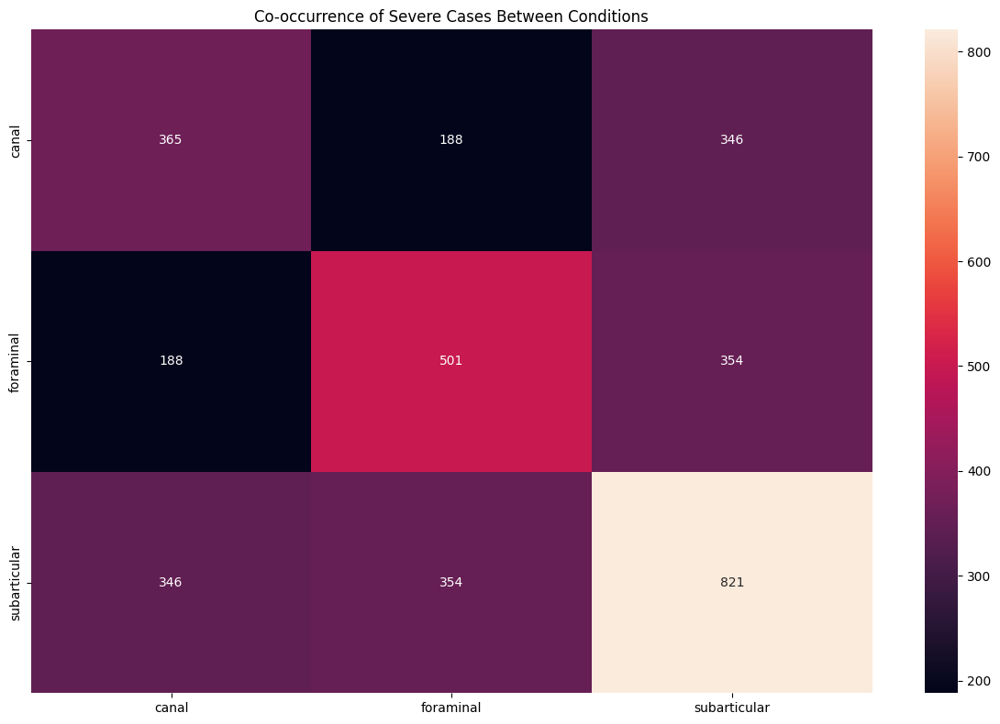


Key Co-occurrence Patterns:
Canal + Foraminal: 188 severe cases
Canal + Subarticular: 346 severe cases
Foraminal + Subarticular: 354 severe cases

3. Analyzing condition patterns across vertebral levels...


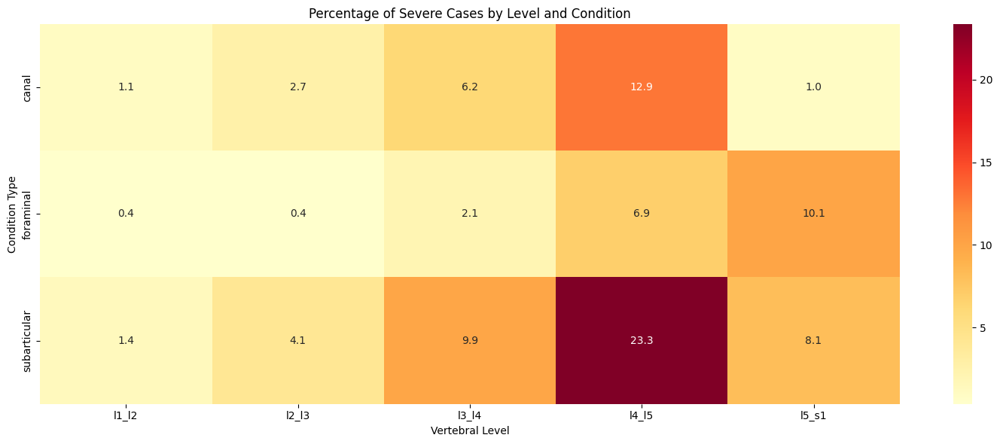


Level-wise Pattern Summary:

Canal patterns:
  l1_l2: 1.1% severe cases
  l2_l3: 2.7% severe cases
  l3_l4: 6.2% severe cases
  l4_l5: 12.9% severe cases
  l5_s1: 1.0% severe cases

Foraminal patterns:
  l1_l2: 0.4% severe cases
  l2_l3: 0.4% severe cases
  l3_l4: 2.1% severe cases
  l4_l5: 6.9% severe cases
  l5_s1: 10.1% severe cases

Subarticular patterns:
  l1_l2: 1.4% severe cases
  l2_l3: 4.1% severe cases
  l3_l4: 9.9% severe cases
  l4_l5: 23.3% severe cases
  l5_s1: 8.1% severe cases

4. Analyzing series descriptions and their relationships to conditions...


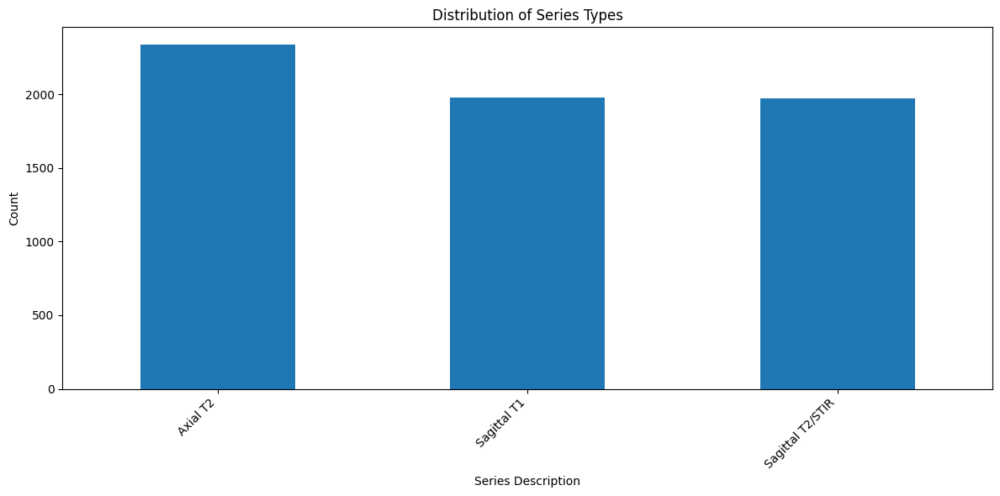


Series Usage by Condition:

Spinal Canal Stenosis:
  Sagittal T2/STIR: 9748 annotations
  Sagittal T1: 5 annotations

Right Neural Foraminal Narrowing:
  Sagittal T1: 9859 annotations

Left Neural Foraminal Narrowing:
  Sagittal T1: 9860 annotations

Left Subarticular Stenosis:
  Axial T2: 9608 annotations

Right Subarticular Stenosis:
  Axial T2: 9612 annotations


In [15]:
if __name__ == "__main__":
    main()

Severe Class Imbalance:

* Normal/Mild: 77.4%
* Moderate: 16.3%
* Severe: 6.3%
This suggests we'll need class balancing techniques.

Condition-Level Patterns:

Different conditions are best visible in different image types:

* Canal Stenosis → Sagittal T2/STIR
* Neural Foraminal Narrowing → Sagittal T1
* Subarticular Stenosis → Axial T2

Level-wise Distribution:

* L4/L5 has highest severity rates across conditions
* Lower levels (L3-S1) show more severe cases than upper levels

# Preprocessing Pipeline

Key preprocessing strategies implemented based on my analysis:

Stratified Fold Creation:

* Uses presence of severe cases for stratification
* Ensures similar distribution of severe cases across folds
* Groups by study_id to prevent data leakage

Condition-Specific Processing:

Maps each condition to its most informative series type:

* Canal Stenosis → Sagittal T2/STIR
* Foraminal Narrowing → Sagittal T1
* Subarticular Stenosis → Axial T2

Image Processing:

* Normalizes pixel values
* Extracts patches around annotation points
* Maintains spatial context around pathologies

Class Balancing:

* Applies augmentation only to severe cases
* Uses rotation and flipping to increase severe class representation
* Helps address the 77.4% vs 6.3% class imbalance

In [16]:
from pathlib import Path
from typing import Dict, List, Tuple
from sklearn.model_selection import StratifiedGroupKFold
from collections import defaultdict

In [17]:
def save_processed_data(samples: List[Dict], filename: str):
    """Save processed samples to a numpy file"""
    # Convert samples to numpy arrays for efficient storage
    processed_data = {
        'images': [],
        'conditions': [],
        'levels': [],
        'severities': [],
        'study_ids': []
    }
    
    # Only save samples with valid severity
    valid_samples = [
        sample for sample in samples 
        if isinstance(sample.get('severity'), str) and not pd.isna(sample.get('severity'))
    ]
    
    for sample in valid_samples:
        processed_data['images'].append(sample['image'])
        processed_data['conditions'].append(sample['condition'])
        processed_data['levels'].append(sample['level'])
        processed_data['severities'].append(sample['severity'])
        processed_data['study_ids'].append(sample['study_id'])
    
    # Convert lists to numpy arrays
    for key in processed_data:
        processed_data[key] = np.array(processed_data[key])
    
    # Save to file
    np.save(filename, processed_data)
    print(f"Saved {len(valid_samples)} valid samples to {filename}")


In [18]:
def create_stratified_folds(train_df: pd.DataFrame, n_splits: int = 5) -> List[Dict]:
    """Create stratified folds ensuring similar distribution of severe cases"""
    # Create severity indicator for stratification
    severity_cols = [col for col in train_df.columns 
                    if any(c in col for c in ['canal', 'foraminal', 'subarticular'])]
    
    # Create binary indicator for having any severe case
    train_df['has_severe'] = (train_df[severity_cols] == 'Severe').any(axis=1)
    
    # Initialize fold splitter
    skf = StratifiedGroupKFold(n_splits=n_splits, shuffle=True, random_state=42)
    
    # Create folds
    folds = []
    for train_idx, val_idx in skf.split(
        train_df, 
        train_df['has_severe'], 
        groups=train_df['study_id']
    ):
        fold = {
            'train': train_df.iloc[train_idx]['study_id'].tolist(),
            'val': train_df.iloc[val_idx]['study_id'].tolist()
        }
        folds.append(fold)
    
    return folds


In [19]:
def process_fold_data(
    study_ids: List[int],
    base_path: str,
    coords_df: pd.DataFrame,
    series_df: pd.DataFrame,
    train_df: pd.DataFrame,
    augment: bool = False
) -> List[Dict]:
    """Process data for a set of studies"""
    processed_data = []
    
    for study_id in study_ids:
        # Get series information for this study
        study_series = series_df[series_df['study_id'] == study_id]
        
        # Process each condition type with its corresponding series
        processed_data.extend(
            process_study_images(
                study_id=study_id,
                base_path=base_path,
                study_series=study_series,
                coords_df=coords_df,
                train_df=train_df,
                augment=augment
            )
        )
    
    return processed_data


In [20]:
def process_study_images(
    study_id: int,
    base_path: str,
    study_series: pd.DataFrame,
    coords_df: pd.DataFrame,
    train_df: pd.DataFrame,
    augment: bool = False
) -> List[Dict]:
    """Process images for a single study"""
    processed_samples = []
    study_path = Path(base_path) / 'train_images' / str(study_id)
    
    # Get study data
    study_coords = coords_df[coords_df['study_id'] == study_id]
    study_labels = train_df[train_df['study_id'] == study_id]
    
    # Process each type of condition with its corresponding series type
    condition_series_map = {
        'Spinal Canal Stenosis': 'Sagittal T2',
        'Neural Foraminal Narrowing': 'Sagittal T1',
        'Subarticular Stenosis': 'Axial T2'
    }
    
    for condition, series_type in condition_series_map.items():
        # Get relevant series
        series = study_series[
            study_series['series_description'].str.contains(series_type, na=False)
        ]
        
        for _, series_row in series.iterrows():
            series_id = series_row['series_id']
            series_path = study_path / str(series_id)
            
            # Get coordinates for this series
            series_coords = study_coords[
                (study_coords['series_id'] == series_id) &
                (study_coords['condition'].str.contains(condition, na=False))
            ]
            
            # Process each image in the series
            for _, coord_row in series_coords.iterrows():
                # Get severity from labels
                label_col = f"{coord_row['condition'].lower().replace(' ', '_')}_{coord_row['level'].lower().replace('/', '_')}"
                if label_col in study_labels.columns:
                    severity = study_labels[label_col].iloc[0]
                    
                    # Process image
                    processed = process_single_image(
                        series_path=series_path,
                        coord_row=coord_row,
                        severity=severity,
                        augment=augment
                    )
                    if processed:
                        processed_samples.extend(processed)
    
    return processed_samples


In [21]:
def process_single_image(
    series_path: Path,
    coord_row: pd.Series,
    severity: str,
    augment: bool = False
) -> List[Dict]:
    """Process a single image and its annotation"""
    processed_samples = []
    
    # Load DICOM image
    dcm_path = series_path / f"{int(coord_row['instance_number'])}.dcm"
    if not dcm_path.exists():
        return None
    
    try:
        dcm = pydicom.dcmread(str(dcm_path))
        image = dcm.pixel_array
        
        # Preprocess image
        processed_image = preprocess_image(
            image,
            int(coord_row['x']),
            int(coord_row['y'])
        )
        
        # Create base sample
        sample = {
            'image': processed_image,
            'study_id': coord_row['study_id'],
            'condition': coord_row['condition'],
            'level': coord_row['level'].replace('/', '_'),
            'severity': severity,
            'coordinates': (coord_row['x'], coord_row['y'])
        }
        
        processed_samples.append(sample)
        
        # Apply augmentations if required
        if augment and severity == 'Severe':
            augmented_samples = apply_augmentations(sample)
            processed_samples.extend(augmented_samples)
            
        return processed_samples
    except:
        return None


In [22]:
def preprocess_image(
    image: np.ndarray,
    x: int,
    y: int,
    patch_size: int = 224
) -> np.ndarray:
    """Preprocess a single image"""
    # Normalize pixel values
    normalized = cv2.normalize(
        image,
        None,
        alpha=0,
        beta=255,
        norm_type=cv2.NORM_MINMAX,
        dtype=cv2.CV_8U
    )
    
    # Extract patch around the annotation point
    half_size = patch_size // 2
    
    # Pad image if necessary
    padded = np.pad(
        normalized,
        ((half_size, half_size), (half_size, half_size)),
        mode='constant',
        constant_values=0
    )
    
    # Extract patch
    x_start = x + half_size - half_size
    x_end = x + half_size + half_size
    y_start = y + half_size - half_size
    y_end = y + half_size + half_size
    
    patch = padded[y_start:y_end, x_start:x_end]
    
    # Ensure patch size
    if patch.shape != (patch_size, patch_size):
        patch = cv2.resize(patch, (patch_size, patch_size))
    
    # Add channel dimension
    patch = np.expand_dims(patch, axis=-1)
    
    return patch

In [23]:
def apply_augmentations(sample: Dict) -> List[Dict]:
    """Apply augmentations to balance severe cases"""
    augmented_samples = []
    
    # Add rotated versions
    for angle in [90, 180, 270]:
        aug_sample = sample.copy()
        aug_sample['image'] = np.rot90(sample['image'], k=angle//90)
        augmented_samples.append(aug_sample)
    
    # Add flipped versions
    aug_sample = sample.copy()
    aug_sample['image'] = np.flip(sample['image'], axis=1)
    augmented_samples.append(aug_sample)
    
    return augmented_samples


In [24]:
def main():
    """Main function for preprocessing pipeline"""
    # Set paths
    base_path = '/kaggle/input/rsna-2024-lumbar-spine-degenerative-classification'
    
    # Load data
    train_df = pd.read_csv(f"{base_path}/train.csv")
    coords_df = pd.read_csv(f"{base_path}/train_label_coordinates.csv")
    series_df = pd.read_csv(f"{base_path}/train_series_descriptions.csv")
    
    # Create train-validation split
    print("Creating stratified fold splits...")
    folds = create_stratified_folds(train_df)
    
    # Process example fold
    fold_num = 0
    train_studies = folds[fold_num]['train']
    val_studies = folds[fold_num]['val']
    
    print(f"\nProcessing fold {fold_num}...")
    # Process training data
    train_samples = process_fold_data(
        study_ids=train_studies,
        base_path=base_path,
        coords_df=coords_df,
        series_df=series_df,
        train_df=train_df,
        augment=True
    )
    
    # Process validation data
    val_samples = process_fold_data(
        study_ids=val_studies,
        base_path=base_path,
        coords_df=coords_df,
        series_df=series_df,
        train_df=train_df,
        augment=False
    )
    
    print(f"Processed {len(train_samples)} training samples and {len(val_samples)} validation samples")
    
    # Save processed data
    print("\nSaving processed data...")
    save_processed_data(train_samples, '/kaggle/working/train_processed.npy')
    save_processed_data(val_samples, '/kaggle/working/val_processed.npy')


In [25]:
if __name__ == "__main__":
    main()

Creating stratified fold splits...

Processing fold 0...
Processed 48932 training samples and 9731 validation samples

Saving processed data...
Saved 48907 valid samples to /kaggle/working/train_processed.npy
Saved 9721 valid samples to /kaggle/working/val_processed.npy


# Classification Model

I start with the classification model first. Here's why:

* The main evaluation metric emphasizes detecting "any_severe_spinal" conditions, which is a classification task
* Classification model will help us understand the key features for identifying severity levels
* The learned features from classification can inform the regression model development later

In [26]:
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader
import torch.optim.lr_scheduler 
import timm
import numpy as np
from typing import Dict, List, Tuple
import pandas as pd
import pydicom
from pathlib import Path
import cv2

In [27]:
class LumbarSpineDataset(Dataset):
    """Dataset class for Lumbar Spine Classification"""
    def __init__(self, samples: List[Dict], augment: bool = False):
        # Filter out samples with nan severity
        self.samples = [
            sample for sample in samples 
            if isinstance(sample['severity'], str) and not pd.isna(sample['severity'])
        ]
        self.augment = augment
        
        # Map conditions to indices
        self.condition_map = {
            'Spinal Canal Stenosis': 0,
            'Left Neural Foraminal Narrowing': 1,
            'Right Neural Foraminal Narrowing': 2,
            'Left Subarticular Stenosis': 3,
            'Right Subarticular Stenosis': 4
        }
        
        # Map levels to indices
        self.level_map = {
            'L1_L2': 0, 'L2_L3': 1, 'L3_L4': 2, 'L4_L5': 3, 'L5_S1': 4
        }
        
        # Map severity to indices
        self.severity_map = {
            'Normal/Mild': 0,
            'Moderate': 1,
            'Severe': 2
        }
        
        print(f"After filtering nan values: {len(self.samples)} valid samples")
    
    def __len__(self):
        return len(self.samples)
    
    def __getitem__(self, idx):
        sample = self.samples[idx]
        
        # Convert image to torch tensor
        image = torch.from_numpy(sample['image']).float()
        image = image.permute(2, 0, 1)  # CHW format
        
        # Create condition one-hot encoding
        condition = torch.zeros(len(self.condition_map))
        condition[self.condition_map[sample['condition']]] = 1
        
        # Create level one-hot encoding
        level = torch.zeros(len(self.level_map))
        level[self.level_map[sample['level']]] = 1
        
        # Create severity label
        severity = torch.tensor(self.severity_map[sample['severity']])
        
        return {
            'image': image,
            'condition': condition,
            'level': level,
            'severity': severity,
            'study_id': sample['study_id']
        }

In [28]:
class AttentionBlock(nn.Module):
    def __init__(self, in_channels):
        super().__init__()
        self.attention = nn.Sequential(
            nn.Conv2d(in_channels, in_channels // 8, 1),
            nn.ReLU(),
            nn.Conv2d(in_channels // 8, in_channels, 1),
            nn.Sigmoid()
        )
    
    def forward(self, x):
        attention_weights = self.attention(x)
        return x * attention_weights


In [29]:
class LumbarClassifier(nn.Module):
    def __init__(self, num_classes=3):
        super().__init__()
        
        # Load pretrained EfficientNetV2 backbone
        self.backbone = timm.create_model(
            'tf_efficientnetv2_s',
            pretrained=True,
            in_chans=1,
            features_only=True
        )
        
        # Get backbone feature dimensions
        dummy_input = torch.randn(1, 1, 224, 224)
        features = self.backbone(dummy_input)
        feature_dims = [f.shape[1] for f in features]
        
        # Attention blocks for each feature level
        self.attention_blocks = nn.ModuleList([
            AttentionBlock(dims) for dims in feature_dims
        ])
        
        # Global Average Pooling
        self.gap = nn.AdaptiveAvgPool2d(1)
        
        # Calculate total feature dimensions
        total_dims = sum(feature_dims)
        
        # BiLSTM for sequential feature processing
        self.bilstm = nn.LSTM(
            input_size=total_dims,
            hidden_size=512,
            num_layers=2,
            bidirectional=True,
            batch_first=True
        )
        
        # Condition and level embedding
        self.condition_embed = nn.Linear(5, 64)  # 5 conditions
        self.level_embed = nn.Linear(5, 64)      # 5 levels
        
        # Final classification layers
        self.classifier = nn.Sequential(
            nn.Linear(2*512 + 64 + 64, 512),  # BiLSTM + condition + level
            nn.ReLU(),
            nn.Dropout(0.3),
            nn.Linear(512, 256),
            nn.ReLU(),
            nn.Dropout(0.2),
            nn.Linear(256, num_classes)
        )
        
        # Initialize weights
        self._initialize_weights()
    
    def _initialize_weights(self):
        for m in self.modules():
            if isinstance(m, nn.Conv2d):
                nn.init.kaiming_normal_(m.weight)
            elif isinstance(m, nn.BatchNorm2d):
                nn.init.constant_(m.weight, 1)
                nn.init.constant_(m.bias, 0)
            elif isinstance(m, nn.Linear):
                nn.init.kaiming_normal_(m.weight)
                nn.init.constant_(m.bias, 0)
    
    def forward(self, x, condition, level):
        # Get backbone features
        features = self.backbone(x)
        
        # Apply attention to each feature level
        attended_features = [
            att(feat) for feat, att in zip(features, self.attention_blocks)
        ]
        
        # Global average pooling on each feature map
        pooled_features = [self.gap(feat) for feat in attended_features]
        
        # Concatenate features
        concat_features = torch.cat([
            feat.view(feat.size(0), -1) for feat in pooled_features
        ], dim=1)
        
        # Reshape for LSTM
        lstm_out, _ = self.bilstm(
            concat_features.unsqueeze(1)
        )
        lstm_out = lstm_out[:, -1, :]  # Take last output
        
        # Embed condition and level
        condition_embedding = self.condition_embed(condition)
        level_embedding = self.level_embed(level)
        
        # Concatenate all features
        combined_features = torch.cat([
            lstm_out,
            condition_embedding,
            level_embedding
        ], dim=1)
        
        # Final classification
        logits = self.classifier(combined_features)
        
        return logits

In [30]:
def train_epoch(model, train_loader, criterion, optimizer, device):
    model.train()
    total_loss = 0
    correct = 0
    total = 0
    
    for batch in train_loader:
        images = batch['image'].to(device)
        conditions = batch['condition'].to(device)
        levels = batch['level'].to(device)
        labels = batch['severity'].to(device)
        
        optimizer.zero_grad()
        outputs = model(images, conditions, levels)
        loss = criterion(outputs, labels)
        
        loss.backward()
        optimizer.step()
        
        total_loss += loss.item()
        _, predicted = outputs.max(1)
        total += labels.size(0)
        correct += predicted.eq(labels).sum().item()
    
    return total_loss / len(train_loader), 100. * correct / total

In [31]:
def validate(model, val_loader, criterion, device):
    model.eval()
    total_loss = 0
    correct = 0
    total = 0
    
    with torch.no_grad():
        for batch in val_loader:
            images = batch['image'].to(device)
            conditions = batch['condition'].to(device)
            levels = batch['level'].to(device)
            labels = batch['severity'].to(device)
            
            outputs = model(images, conditions, levels)
            loss = criterion(outputs, labels)
            
            total_loss += loss.item()
            _, predicted = outputs.max(1)
            total += labels.size(0)
            correct += predicted.eq(labels).sum().item()
    
    return total_loss / len(val_loader), 100. * correct / total

In [32]:
def load_processed_data(filename):
    """Load processed samples from numpy file"""
    processed_data = np.load(filename, allow_pickle=True).item()
    
    # Convert back to list of dictionaries format
    samples = []
    for i in range(len(processed_data['images'])):
        sample = {
            'image': processed_data['images'][i],
            'condition': processed_data['conditions'][i],
            'level': processed_data['levels'][i],
            'severity': processed_data['severities'][i],
            'study_id': processed_data['study_ids'][i]
        }
        samples.append(sample)
    
    return samples

In [33]:
def main():
    # Set device
    device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
    print(f"Using device: {device}")
    
    print("Loading processed data...")
    train_samples = load_processed_data('/kaggle/working/train_processed.npy')
    val_samples = load_processed_data('/kaggle/working/val_processed.npy')
    print(f"Loaded {len(train_samples)} training samples and {len(val_samples)} validation samples")
    
    # Create datasets and dataloaders
    train_dataset = LumbarSpineDataset(train_samples, augment=True)
    val_dataset = LumbarSpineDataset(val_samples, augment=False)
    
    train_loader = DataLoader(
        train_dataset,
        batch_size=32,
        shuffle=True,
        num_workers=4
    )
    
    val_loader = DataLoader(
        val_dataset,
        batch_size=32,
        shuffle=False,
        num_workers=4
    )
    
    # Create model
    model = LumbarClassifier().to(device)
    print("Created model and moved to device")
    
    # Define loss function with class weights to handle imbalance
    # Weights are inversely proportional to class frequencies
    # [Normal/Mild: 77.4%, Moderate: 16.3%, Severe: 6.3%]
    weights = torch.tensor([1.0, 4.75, 12.29]).to(device)  # Normalized inverse frequencies
    criterion = nn.CrossEntropyLoss(weight=weights)
    
    # Define optimizer and scheduler
    optimizer = torch.optim.AdamW(model.parameters(), lr=1e-4, weight_decay=0.01)
    scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=30, eta_min=1e-6)
    
    # Training parameters
    num_epochs = 30
    best_val_acc = 0
    best_val_loss = float('inf')
    patience = 5
    patience_counter = 0
    
    print("Starting training...")
    for epoch in range(num_epochs):
        print(f"\nEpoch {epoch+1}/{num_epochs}")
        print("-" * 20)
        
        # Training phase
        train_loss, train_acc = train_epoch(
            model=model,
            train_loader=train_loader,
            criterion=criterion,
            optimizer=optimizer,
            device=device
        )
        
        # Validation phase
        val_loss, val_acc = validate(
            model=model,
            val_loader=val_loader,
            criterion=criterion,
            device=device
        )
        
        # Learning rate scheduling
        scheduler.step()
        current_lr = scheduler.get_last_lr()[0]
        
        # Print epoch results
        print(f"Train Loss: {train_loss:.4f}, Train Acc: {train_acc:.2f}%")
        print(f"Val Loss: {val_loss:.4f}, Val Acc: {val_acc:.2f}%")
        print(f"Learning Rate: {current_lr:.6f}")
        
        # Save best model
        if val_acc > best_val_acc:
            best_val_acc = val_acc
            best_val_loss = val_loss
            print("Saving best model...")
            torch.save({
                'epoch': epoch,
                'model_state_dict': model.state_dict(),
                'optimizer_state_dict': optimizer.state_dict(),
                'scheduler_state_dict': scheduler.state_dict(),
                'val_acc': val_acc,
                'val_loss': val_loss,
            }, 'best_model.pth')
            patience_counter = 0
        else:
            patience_counter += 1
        
        # Early stopping
        if patience_counter >= patience:
            print(f"\nEarly stopping triggered after {epoch+1} epochs")
            break
    
    print("\nTraining completed!")
    print(f"Best Validation Accuracy: {best_val_acc:.2f}%")
    print(f"Best Validation Loss: {best_val_loss:.4f}")
    
    # Load best model for final evaluation
    checkpoint = torch.load('best_model.pth')
    model.load_state_dict(checkpoint['model_state_dict'])
    
    # Final validation pass
    final_val_loss, final_val_acc = validate(model, val_loader, criterion, device)
    print("\nFinal Model Performance:")
    print(f"Validation Loss: {final_val_loss:.4f}")
    print(f"Validation Accuracy: {final_val_acc:.2f}%")

In [34]:
if __name__ == "__main__":
    main()

Using device: cuda
Loading processed data...
Loaded 48907 training samples and 9721 validation samples
After filtering nan values: 48907 valid samples
After filtering nan values: 9721 valid samples


model.safetensors:   0%|          | 0.00/86.5M [00:00<?, ?B/s]

Created model and moved to device
Starting training...

Epoch 1/30
--------------------
Train Loss: 0.5034, Train Acc: 62.21%
Val Loss: 0.7661, Val Acc: 71.17%
Learning Rate: 0.000100
Saving best model...

Epoch 2/30
--------------------
Train Loss: 0.3610, Train Acc: 74.42%
Val Loss: 0.6864, Val Acc: 66.64%
Learning Rate: 0.000099

Epoch 3/30
--------------------
Train Loss: 0.2919, Train Acc: 78.46%
Val Loss: 0.6275, Val Acc: 77.31%
Learning Rate: 0.000098
Saving best model...

Epoch 4/30
--------------------
Train Loss: 0.2416, Train Acc: 81.54%
Val Loss: 0.6182, Val Acc: 74.48%
Learning Rate: 0.000096

Epoch 5/30
--------------------
Train Loss: 0.1976, Train Acc: 83.83%
Val Loss: 0.6758, Val Acc: 75.71%
Learning Rate: 0.000093

Epoch 6/30
--------------------
Train Loss: 0.1574, Train Acc: 86.06%
Val Loss: 0.7534, Val Acc: 76.22%
Learning Rate: 0.000091

Epoch 7/30
--------------------
Train Loss: 0.1361, Train Acc: 87.27%
Val Loss: 0.8104, Val Acc: 75.08%
Learning Rate: 0.000087


# Classification Model Analysis

In [35]:
import torch
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix, classification_report
from typing import Dict, List, Tuple

In [36]:
def analyze_classification_model(model_path: str, val_loader: DataLoader, device: torch.device):
    """Analyze classification model performance in detail"""
    # Load the best model
    model = LumbarClassifier().to(device)
    checkpoint = torch.load(model_path)
    model.load_state_dict(checkpoint['model_state_dict'])
    model.eval()
    
    # Initialize lists to store predictions and true labels
    all_preds = []
    all_labels = []
    all_conditions = []
    all_levels = []
    study_ids = []
    
    # Get predictions
    with torch.no_grad():
        for batch in val_loader:
            images = batch['image'].to(device)
            conditions = batch['condition'].to(device)
            levels = batch['level'].to(device)
            labels = batch['severity']
            
            outputs = model(images, conditions, levels)
            _, preds = outputs.max(1)
            
            all_preds.extend(preds.cpu().numpy())
            all_labels.extend(labels.numpy())
            
            # Get condition and level names
            condition_indices = torch.argmax(conditions, dim=1).cpu().numpy()
            level_indices = torch.argmax(levels, dim=1).cpu().numpy()
            
            for c_idx, l_idx in zip(condition_indices, level_indices):
                all_conditions.append(list(val_loader.dataset.condition_map.keys())[c_idx])
                all_levels.append(list(val_loader.dataset.level_map.keys())[l_idx])
            
            study_ids.extend(batch['study_id'])
    
    # Create confusion matrix
    severity_names = ['Normal/Mild', 'Moderate', 'Severe']
    cm = confusion_matrix(all_labels, all_preds)
    
    plt.figure(figsize=(10, 8))
    sns.heatmap(cm, annot=True, fmt='d', xticklabels=severity_names, yticklabels=severity_names)
    plt.title('Confusion Matrix')
    plt.xlabel('Predicted')
    plt.ylabel('True')
    plt.savefig('confusion_matrix.png')
    plt.close()
    
    # Generate classification report
    report = classification_report(all_labels, all_preds, target_names=severity_names)
    print("\nClassification Report:")
    print(report)
    
    # Analyze performance by condition and level
    results_df = pd.DataFrame({
        'Study_ID': study_ids,
        'True_Label': [severity_names[l] for l in all_labels],
        'Predicted': [severity_names[p] for p in all_preds],
        'Condition': all_conditions,
        'Level': all_levels,
        'Correct': [1 if p == l else 0 for p, l in zip(all_preds, all_labels)]
    })
    
    # Performance by condition
    print("\nAccuracy by Condition:")
    condition_acc = results_df.groupby('Condition')['Correct'].mean() * 100
    print(condition_acc)
    
    # Performance by level
    print("\nAccuracy by Level:")
    level_acc = results_df.groupby('Level')['Correct'].mean() * 100
    print(level_acc)
    
    # Save detailed results
    results_df.to_csv('classification_results.csv', index=False)
    
    # Plot accuracy by condition and level
    plt.figure(figsize=(12, 5))
    plt.subplot(1, 2, 1)
    condition_acc.plot(kind='bar')
    plt.title('Accuracy by Condition')
    plt.xticks(rotation=45)
    plt.tight_layout()
    
    plt.subplot(1, 2, 2)
    level_acc.plot(kind='bar')
    plt.title('Accuracy by Level')
    plt.xticks(rotation=45)
    plt.tight_layout()
    
    plt.savefig('accuracy_analysis.png')
    plt.close()
    
    return results_df


In [37]:
def main():
    # Load the same data and model setup as before
    device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
    
    # Load validation data
    val_samples = load_processed_data('/kaggle/working/val_processed.npy')
    val_dataset = LumbarSpineDataset(val_samples, augment=False)
    val_loader = DataLoader(
        val_dataset,
        batch_size=32,
        shuffle=False,
        num_workers=4
    )
    
    # Analyze model
    results_df = analyze_classification_model('best_model.pth', val_loader, device)
    print("\nAnalysis completed and saved to files.")

if __name__ == "__main__":
    main()

After filtering nan values: 9721 valid samples

Classification Report:
              precision    recall  f1-score   support

 Normal/Mild       0.93      0.91      0.92      7607
    Moderate       0.50      0.54      0.52      1528
      Severe       0.59      0.61      0.60       586

    accuracy                           0.83      9721
   macro avg       0.67      0.69      0.68      9721
weighted avg       0.84      0.83      0.84      9721


Accuracy by Condition:
Condition
Left Neural Foraminal Narrowing     82.683544
Left Subarticular Stenosis          82.601881
Right Neural Foraminal Narrowing    84.071247
Right Subarticular Stenosis         77.974948
Spinal Canal Stenosis               89.646335
Name: Correct, dtype: float64

Accuracy by Level:
Level
L1_L2    95.957447
L2_L3    89.061690
L3_L4    79.177247
L4_L5    74.327752
L5_S1    79.259635
Name: Correct, dtype: float64

Analysis completed and saved to files.


Based on the results, we can observe several important insights before moving to the regression model:

Class Imbalance:

* Normal/Mild: 7607 samples (78.3%)
* Moderate: 1528 samples (15.7%)
* Severe: 586 samples (6%)

Performance by Severity:

* Normal/Mild: Strong performance (F1: 0.92)
* Moderate: Struggles most (F1: 0.52)
* Severe: Better than moderate but still challenging (F1: 0.60)

Performance by Condition:

* Best: Spinal Canal Stenosis (89.64%)
* Others: Relatively consistent (~78-84%)

Performance by Level:

* Best: Upper levels (L1_L2: 95.96%, L2_L3: 89.06%)
* Worst: L4_L5 (74.32%)
* Gradient of difficulty from top to bottom

# Regression Model

In [38]:
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader
import torch.optim.lr_scheduler
import timm
import numpy as np
from typing import Dict, List, Tuple

In [39]:
class LumbarSpineRegDataset(Dataset):
    """Dataset class for Lumbar Spine Regression"""
    def __init__(self, samples: List[Dict], augment: bool = False):
        # Filter out samples with nan severity
        self.samples = [
            sample for sample in samples 
            if isinstance(sample['severity'], str) and not pd.isna(sample['severity'])
        ]
        self.augment = augment
        
        # Map conditions to indices
        self.condition_map = {
            'Spinal Canal Stenosis': 0,
            'Left Neural Foraminal Narrowing': 1,
            'Right Neural Foraminal Narrowing': 2,
            'Left Subarticular Stenosis': 3,
            'Right Subarticular Stenosis': 4
        }
        
        # Map levels to indices
        self.level_map = {
            'L1_L2': 0, 'L2_L3': 1, 'L3_L4': 2, 'L4_L5': 3, 'L5_S1': 4
        }
        
        # Map severity to continuous values
        self.severity_map = {
            'Normal/Mild': 0.0,
            'Moderate': 1.0,
            'Severe': 2.0
        }
        
        print(f"After filtering nan values: {len(self.samples)} valid samples")
    
    def __len__(self):
        return len(self.samples)
    
    def __getitem__(self, idx):
        sample = self.samples[idx]
        
        # Convert image to torch tensor
        image = torch.from_numpy(sample['image']).float()
        image = image.permute(2, 0, 1)  # CHW format
        
        # Create condition one-hot encoding
        condition = torch.zeros(len(self.condition_map))
        condition[self.condition_map[sample['condition']]] = 1
        
        # Create level one-hot encoding
        level = torch.zeros(len(self.level_map))
        level[self.level_map[sample['level']]] = 1
        
        # Create severity value
        severity = torch.tensor([self.severity_map[sample['severity']]], dtype=torch.float)
        
        # Create importance weight based on level and severity
        weight = 1.0
        if sample['level'] in ['L4_L5', 'L5_S1']:
            weight *= 1.5
        if sample['severity'] in ['Moderate', 'Severe']:
            weight *= 2.0
        
        return {
            'image': image,
            'condition': condition,
            'level': level,
            'severity': severity,
            'weight': torch.tensor([weight], dtype=torch.float),
            'study_id': sample['study_id']
        }


In [40]:
class LumbarRegressor(nn.Module):
    def __init__(self):
        super().__init__()
        
        # Load pretrained EfficientNetV2 backbone
        self.backbone = timm.create_model(
            'tf_efficientnetv2_s',
            pretrained=True,
            in_chans=1,
            features_only=True
        )
        
        # Get backbone feature dimensions
        dummy_input = torch.randn(1, 1, 224, 224)
        features = self.backbone(dummy_input)
        feature_dims = [f.shape[1] for f in features]
        
        # Attention blocks for each feature level
        self.attention_blocks = nn.ModuleList([
            AttentionBlock(dims) for dims in feature_dims
        ])
        
        # Global Average Pooling
        self.gap = nn.AdaptiveAvgPool2d(1)
        
        # Calculate total feature dimensions
        total_dims = sum(feature_dims)
        
        # BiLSTM for sequential feature processing
        self.bilstm = nn.LSTM(
            input_size=total_dims,
            hidden_size=512,
            num_layers=2,
            bidirectional=True,
            batch_first=True
        )
        
        # Condition and level embedding
        self.condition_embed = nn.Linear(5, 64)  # 5 conditions
        self.level_embed = nn.Linear(5, 64)      # 5 levels
        
        # Regression head
        self.regressor = nn.Sequential(
            nn.Linear(2*512 + 64 + 64, 512),
            nn.ReLU(),
            nn.Dropout(0.3),
            nn.Linear(512, 256),
            nn.ReLU(),
            nn.Dropout(0.2),
            nn.Linear(256, 1),
            nn.Sigmoid()  # Output between 0 and 1
        )
        
        self._initialize_weights()
    
    def _initialize_weights(self):
        for m in self.modules():
            if isinstance(m, nn.Conv2d):
                nn.init.kaiming_normal_(m.weight)
            elif isinstance(m, nn.BatchNorm2d):
                nn.init.constant_(m.weight, 1)
                nn.init.constant_(m.bias, 0)
            elif isinstance(m, nn.Linear):
                nn.init.kaiming_normal_(m.weight)
                nn.init.constant_(m.bias, 0)
    
    def forward(self, x, condition, level):
        # Get backbone features
        features = self.backbone(x)
        
        # Apply attention to each feature level
        attended_features = [
            att(feat) for feat, att in zip(features, self.attention_blocks)
        ]
        
        # Global average pooling on each feature map
        pooled_features = [self.gap(feat) for feat in attended_features]
        
        # Concatenate features
        concat_features = torch.cat([
            feat.view(feat.size(0), -1) for feat in pooled_features
        ], dim=1)
        
        # Reshape for LSTM
        lstm_out, _ = self.bilstm(
            concat_features.unsqueeze(1)
        )
        lstm_out = lstm_out[:, -1, :]  # Take last output
        
        # Embed condition and level
        condition_embedding = self.condition_embed(condition)
        level_embedding = self.level_embed(level)
        
        # Concatenate all features
        combined_features = torch.cat([
            lstm_out,
            condition_embedding,
            level_embedding
        ], dim=1)
        
        # Regression output
        return self.regressor(combined_features) * 2.0  # Scale to 0-2 range


In [41]:
class WeightedL1Loss(nn.Module):
    def __init__(self):
        super().__init__()
        
    def forward(self, pred, target, weight):
        return (weight * torch.abs(pred - target)).mean()


In [42]:
def train_epoch(model, train_loader, criterion, optimizer, device):
    model.train()
    total_loss = 0
    
    for batch in train_loader:
        images = batch['image'].to(device)
        conditions = batch['condition'].to(device)
        levels = batch['level'].to(device)
        targets = batch['severity'].to(device)
        weights = batch['weight'].to(device)
        
        optimizer.zero_grad()
        outputs = model(images, conditions, levels)
        loss = criterion(outputs, targets, weights)
        
        loss.backward()
        optimizer.step()
        
        total_loss += loss.item()
    
    return total_loss / len(train_loader)

In [43]:
def validate(model, val_loader, criterion, device):
    model.eval()
    total_loss = 0
    all_preds = []
    all_targets = []
    
    with torch.no_grad():
        for batch in val_loader:
            images = batch['image'].to(device)
            conditions = batch['condition'].to(device)
            levels = batch['level'].to(device)
            targets = batch['severity'].to(device)
            weights = batch['weight'].to(device)
            
            outputs = model(images, conditions, levels)
            loss = criterion(outputs, targets, weights)
            
            total_loss += loss.item()
            all_preds.extend(outputs.cpu().numpy())
            all_targets.extend(targets.cpu().numpy())
    
    mae = np.mean(np.abs(np.array(all_preds) - np.array(all_targets)))
    return total_loss / len(val_loader), mae

In [44]:
def main():
    # Set device
    device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
    print(f"Using device: {device}")
    
    # Load data
    print("Loading processed data...")
    train_samples = load_processed_data('/kaggle/working/train_processed.npy')
    val_samples = load_processed_data('/kaggle/working/val_processed.npy')
    
    # Create datasets and dataloaders
    train_dataset = LumbarSpineRegDataset(train_samples, augment=True)
    val_dataset = LumbarSpineRegDataset(val_samples, augment=False)
    
    train_loader = DataLoader(
        train_dataset,
        batch_size=32,
        shuffle=True,
        num_workers=4
    )
    
    val_loader = DataLoader(
        val_dataset,
        batch_size=32,
        shuffle=False,
        num_workers=4
    )
    
    # Create model
    model = LumbarRegressor().to(device)
    criterion = WeightedL1Loss()
    optimizer = torch.optim.AdamW(model.parameters(), lr=1e-4, weight_decay=0.01)
    scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=30, eta_min=1e-6)
    
    # Training parameters
    num_epochs = 30
    best_val_loss = float('inf')
    patience = 5
    patience_counter = 0
    
    print("Starting training...")
    for epoch in range(num_epochs):
        print(f"\nEpoch {epoch+1}/{num_epochs}")
        print("-" * 20)
        
        train_loss = train_epoch(model, train_loader, criterion, optimizer, device)
        val_loss, val_mae = validate(model, val_loader, criterion, device)
        scheduler.step()
        
        print(f"Train Loss: {train_loss:.4f}")
        print(f"Val Loss: {val_loss:.4f}, Val MAE: {val_mae:.4f}")
        
        if val_loss < best_val_loss:
            best_val_loss = val_loss
            print("Saving best model...")
            torch.save({
                'epoch': epoch,
                'model_state_dict': model.state_dict(),
                'optimizer_state_dict': optimizer.state_dict(),
                'val_loss': val_loss,
                'val_mae': val_mae
            }, 'best_regression_model.pth')
            patience_counter = 0
        else:
            patience_counter += 1
        
        if patience_counter >= patience:
            print(f"\nEarly stopping triggered after {epoch+1} epochs")
            break
    
    print("\nTraining completed!")
    print(f"Best Validation Loss: {best_val_loss:.4f}")


In [45]:
if __name__ == "__main__":
    main()

Using device: cuda
Loading processed data...
After filtering nan values: 48907 valid samples
After filtering nan values: 9721 valid samples
Starting training...

Epoch 1/30
--------------------
Train Loss: 0.6827
Val Loss: 0.5669, Val MAE: 0.2730
Saving best model...

Epoch 2/30
--------------------
Train Loss: 0.4680
Val Loss: 0.5233, Val MAE: 0.2477
Saving best model...

Epoch 3/30
--------------------
Train Loss: 0.3924
Val Loss: 0.4304, Val MAE: 0.1998
Saving best model...

Epoch 4/30
--------------------
Train Loss: 0.3568
Val Loss: 0.4117, Val MAE: 0.2108
Saving best model...

Epoch 5/30
--------------------
Train Loss: 0.3381
Val Loss: 0.3846, Val MAE: 0.1808
Saving best model...

Epoch 6/30
--------------------
Train Loss: 0.3204
Val Loss: 0.3892, Val MAE: 0.1963

Epoch 7/30
--------------------
Train Loss: 0.3125
Val Loss: 0.4287, Val MAE: 0.2426

Epoch 8/30
--------------------
Train Loss: 0.3102
Val Loss: 0.4005, Val MAE: 0.1932

Epoch 9/30
--------------------
Train Loss: 0

# Regression Model Analysis

In [46]:
import torch
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
from typing import Dict, List, Tuple

In [47]:
def analyze_regression_model(model_path: str, val_loader: DataLoader, device: torch.device):
    """Analyze regression model performance in detail"""
    # Load the best model
    model = LumbarRegressor().to(device)
    checkpoint = torch.load(model_path)
    model.load_state_dict(checkpoint['model_state_dict'])
    model.eval()
    
    # Initialize lists to store predictions and true values
    predictions = []
    true_values = []
    conditions = []
    levels = []
    study_ids = []
    weights = []
    
    # Get predictions
    with torch.no_grad():
        for batch in val_loader:
            images = batch['image'].to(device)
            condition_tensor = batch['condition'].to(device)
            level_tensor = batch['level'].to(device)
            targets = batch['severity']
            
            outputs = model(images, condition_tensor, level_tensor)
            
            predictions.extend(outputs.cpu().numpy())
            true_values.extend(targets.numpy())
            weights.extend(batch['weight'].numpy())
            
            # Get condition and level names
            condition_indices = torch.argmax(condition_tensor, dim=1).cpu().numpy()
            level_indices = torch.argmax(level_tensor, dim=1).cpu().numpy()
            
            for c_idx, l_idx in zip(condition_indices, level_indices):
                conditions.append(list(val_loader.dataset.condition_map.keys())[c_idx])
                levels.append(list(val_loader.dataset.level_map.keys())[l_idx])
            
            study_ids.extend(batch['study_id'])
    
    # Convert to numpy arrays
    predictions = np.array(predictions)
    true_values = np.array(true_values)
    
    # Calculate metrics
    mae = mean_absolute_error(true_values, predictions)
    rmse = np.sqrt(mean_squared_error(true_values, predictions))
    r2 = r2_score(true_values, predictions)
    
    print("\nOverall Metrics:")
    print(f"Mean Absolute Error: {mae:.4f}")
    print(f"Root Mean Squared Error: {rmse:.4f}")
    print(f"R² Score: {r2:.4f}")
    
    # Create DataFrame for detailed analysis
    results_df = pd.DataFrame({
        'Study_ID': study_ids,
        'True_Value': true_values.flatten(),
        'Predicted': predictions.flatten(),
        'Condition': conditions,
        'Level': levels,
        'Weight': weights,
        'Absolute_Error': np.abs(predictions.flatten() - true_values.flatten())
    })
    
    # Analyze by condition
    print("\nMAE by Condition:")
    condition_mae = results_df.groupby('Condition')['Absolute_Error'].mean()
    print(condition_mae)
    
    # Analyze by level
    print("\nMAE by Level:")
    level_mae = results_df.groupby('Level')['Absolute_Error'].mean()
    print(level_mae)
    
    # Plot prediction vs true values
    plt.figure(figsize=(10, 8))
    plt.scatter(true_values, predictions, alpha=0.5)
    plt.plot([0, 2], [0, 2], 'r--')  # Perfect prediction line
    plt.xlabel('True Values')
    plt.ylabel('Predictions')
    plt.title('Prediction vs True Values')
    plt.savefig('regression_scatter.png')
    plt.close()
    
    # Plot error distribution
    plt.figure(figsize=(10, 6))
    sns.histplot(data=results_df['Absolute_Error'], bins=50)
    plt.title('Error Distribution')
    plt.xlabel('Absolute Error')
    plt.ylabel('Count')
    plt.savefig('error_distribution.png')
    plt.close()
    
    # Plot MAE by condition
    plt.figure(figsize=(12, 5))
    plt.subplot(1, 2, 1)
    condition_mae.plot(kind='bar')
    plt.title('MAE by Condition')
    plt.xticks(rotation=45)
    plt.tight_layout()
    
    # Plot MAE by level
    plt.subplot(1, 2, 2)
    level_mae.plot(kind='bar')
    plt.title('MAE by Level')
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.savefig('mae_analysis.png')
    plt.close()
    
    # Error analysis by severity range
    def get_severity_range(value):
        if value <= 0.5:
            return 'Normal/Mild'
        elif value <= 1.5:
            return 'Moderate'
        else:
            return 'Severe'
    
    results_df['Severity_Range'] = results_df['True_Value'].apply(get_severity_range)
    
    print("\nMAE by Severity Range:")
    severity_mae = results_df.groupby('Severity_Range')['Absolute_Error'].mean()
    print(severity_mae)
    
    # Save detailed results
    results_df.to_csv('regression_results.csv', index=False)
    
    # Compare with classification model performance
    print("\nSeverity Range Distribution:")
    print(results_df['Severity_Range'].value_counts(normalize=True) * 100)
    
    return results_df


In [48]:
def main():
    # Set device
    device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
    
    # Load validation data
    val_samples = load_processed_data('/kaggle/working/val_processed.npy')
    val_dataset = LumbarSpineRegDataset(val_samples, augment=False)
    val_loader = DataLoader(
        val_dataset,
        batch_size=32,
        shuffle=False,
        num_workers=4
    )
    
    # Analyze model
    results_df = analyze_regression_model('best_regression_model.pth', val_loader, device)
    print("\nAnalysis completed and saved to files.")

if __name__ == "__main__":
    main()

After filtering nan values: 9721 valid samples

Overall Metrics:
Mean Absolute Error: 0.1631
Root Mean Squared Error: 0.4097
R² Score: 0.4774

MAE by Condition:
Condition
Left Neural Foraminal Narrowing     0.166863
Left Subarticular Stenosis          0.183087
Right Neural Foraminal Narrowing    0.166376
Right Subarticular Stenosis         0.206151
Spinal Canal Stenosis               0.093956
Name: Absolute_Error, dtype: float32

MAE by Level:
Level
L1_L2    0.042005
L2_L3    0.097401
L3_L4    0.185674
L4_L5    0.270522
L5_S1    0.212758
Name: Absolute_Error, dtype: float32

MAE by Severity Range:
Severity_Range
Moderate       0.382710
Normal/Mild    0.090366
Severe         0.534145
Name: Absolute_Error, dtype: float32

Severity Range Distribution:
Severity_Range
Normal/Mild    78.253266
Moderate       15.718547
Severe          6.028186
Name: proportion, dtype: float64

Analysis completed and saved to files.


# Evaluation Metrics

In [49]:
from sklearn.metrics import log_loss
from typing import Dict, List, Tuple

In [60]:
def load_processed_data(filename: str) -> List[Dict]:
    """Load processed samples from numpy file"""
    processed_data = np.load(filename, allow_pickle=True).item()
    
    # Convert back to list of dictionaries format
    samples = []
    for i in range(len(processed_data['images'])):
        sample = {
            'image': processed_data['images'][i],
            'condition': processed_data['conditions'][i],
            'level': processed_data['levels'][i],
            'severity': processed_data['severities'][i],
            'study_id': processed_data['study_ids'][i]
        }
        samples.append(sample)
    
    return samples

In [61]:
def compute_competition_metric(predictions: np.ndarray,
                             true_labels: np.ndarray,
                             study_ids: np.ndarray,
                             conditions: List[str],
                             levels: List[str]) -> Tuple[float, Dict]:
    """
    Compute the competition metric: average of sample weighted log losses and any_severe_spinal
    """
    # Create DataFrame with all information
    results_df = pd.DataFrame({
        'study_id': study_ids,
        'condition': conditions,
        'level': levels
    })

    # Convert true labels to one-hot encoding
    true_labels_onehot = np.zeros((len(true_labels), 3))
    for i, label in enumerate(true_labels):
        true_labels_onehot[i, int(label)] = 1

    # Add true labels and predictions to DataFrame
    results_df['true_normal_mild'] = true_labels_onehot[:, 0]
    results_df['true_moderate'] = true_labels_onehot[:, 1]
    results_df['true_severe'] = true_labels_onehot[:, 2]
    results_df['pred_normal_mild'] = predictions[:, 0]
    results_df['pred_moderate'] = predictions[:, 1]
    results_df['pred_severe'] = predictions[:, 2]

    # Initialize metrics
    metrics = {}
    total_loss = 0
    total_weight = 0

    # Define condition weights
    condition_weights = {
        'Spinal Canal Stenosis': {
            'L1_L2': 0.08, 'L2_L3': 0.14, 'L3_L4': 0.22, 'L4_L5': 0.35, 'L5_S1': 0.21
        },
        'Left Neural Foraminal Narrowing': {
            'L1_L2': 0.07, 'L2_L3': 0.13, 'L3_L4': 0.21, 'L4_L5': 0.33, 'L5_S1': 0.26
        },
        'Right Neural Foraminal Narrowing': {
            'L1_L2': 0.07, 'L2_L3': 0.13, 'L3_L4': 0.21, 'L4_L5': 0.33, 'L5_S1': 0.26
        },
        'Left Subarticular Stenosis': {
            'L1_L2': 0.07, 'L2_L3': 0.13, 'L3_L4': 0.21, 'L4_L5': 0.33, 'L5_S1': 0.26
        },
        'Right Subarticular Stenosis': {
            'L1_L2': 0.07, 'L2_L3': 0.13, 'L3_L4': 0.21, 'L4_L5': 0.33, 'L5_S1': 0.26
        }
    }

    # Compute weighted log loss for each condition and level
    for condition in condition_weights.keys():
        for level in condition_weights[condition].keys():
            mask = (results_df['condition'] == condition) & (results_df['level'] == level)
            if mask.any():
                y_true = results_df.loc[mask, ['true_normal_mild', 'true_moderate', 'true_severe']].values
                y_pred = results_df.loc[mask, ['pred_normal_mild', 'pred_moderate', 'pred_severe']].values

                # Add small epsilon to avoid log(0)
                y_pred = np.clip(y_pred, 1e-7, 1-1e-7)
                
                try:
                    ll = log_loss(y_true, y_pred)
                    weight = condition_weights[condition][level]
                    total_loss += ll * weight
                    total_weight += weight
                    metrics[f'{condition}_{level}_log_loss'] = ll
                except ValueError as e:
                    print(f"Warning: Error computing log loss for {condition} {level}: {e}")
                    continue

    # Compute weighted average log loss
    if total_weight > 0:
        weighted_log_loss = total_loss / total_weight
    else:
        weighted_log_loss = 0
    metrics['weighted_log_loss'] = weighted_log_loss

    # Compute any_severe_spinal metric
    study_severe_true = []
    study_severe_pred = []

    for study_id in results_df['study_id'].unique():
        study_mask = results_df['study_id'] == study_id
        study_data = results_df[study_mask]

        # True severe cases
        has_severe = (study_data['true_severe'] == 1).any()
        study_severe_true.append(has_severe)

        # Predicted severe cases
        pred_severe = study_data['pred_severe'].max()
        study_severe_pred.append(pred_severe)

    # Add small epsilon to avoid log(0)
    study_severe_pred = np.clip(study_severe_pred, 1e-7, 1-1e-7)
    
    try:
        any_severe_loss = log_loss(study_severe_true, study_severe_pred)
    except ValueError as e:
        print(f"Warning: Error computing any_severe_loss: {e}")
        any_severe_loss = 0

    metrics['any_severe_loss'] = any_severe_loss

    # Compute final score
    final_score = 0.7 * weighted_log_loss + 0.3 * any_severe_loss
    metrics['final_score'] = final_score

    return final_score, metrics


In [62]:
def evaluate_model(model, val_loader, device):
    """Evaluate model using competition metrics"""
    model.eval()
    all_predictions = []
    all_labels = []
    all_study_ids = []
    all_conditions = []
    all_levels = []

    with torch.no_grad():
        for batch in val_loader:
            images = batch['image'].to(device)
            conditions = batch['condition'].to(device)
            levels = batch['level'].to(device)

            # Get model predictions
            outputs = model(images, conditions, levels)
            probs = F.softmax(outputs, dim=1)

            # Store results
            all_predictions.append(probs.cpu().numpy())
            all_labels.append(batch['severity'].numpy())
            all_study_ids.extend(batch['study_id'])

            # Get condition and level names
            for c_idx, l_idx in zip(torch.argmax(conditions, dim=1).cpu().numpy(),
                                  torch.argmax(levels, dim=1).cpu().numpy()):
                all_conditions.append(list(val_loader.dataset.condition_map.keys())[c_idx])
                all_levels.append(list(val_loader.dataset.level_map.keys())[l_idx])

    # Concatenate all predictions
    predictions = np.concatenate(all_predictions)
    labels = np.concatenate(all_labels)

    # Compute metrics
    score, metrics = compute_competition_metric(
        predictions,
        labels,
        np.array(all_study_ids),
        all_conditions,
        all_levels
    )

    return score, metrics


In [63]:
def evaluate_regression_model(model, val_loader, device):
    """Evaluate regression model with proper probability conversion"""
    model.eval()
    all_predictions = []
    all_labels = []
    all_study_ids = []
    all_conditions = []
    all_levels = []

    with torch.no_grad():
        for batch in val_loader:
            images = batch['image'].to(device)
            conditions = batch['condition'].to(device)
            levels = batch['level'].to(device)

            # Get regression predictions
            reg_output = model(images, conditions, levels)
            reg_output = reg_output.squeeze()  # Remove all extra dimensions

            # Convert regression values to probabilities
            probs = torch.zeros((reg_output.shape[0], 3), device=device)

            # Normal/Mild: values <= 0.5
            normal_mask = reg_output <= 0.5
            probs[normal_mask, 0] = 1.0

            # Moderate: values between 0.5 and 1.5
            moderate_mask = (reg_output > 0.5) & (reg_output <= 1.5)
            probs[moderate_mask, 1] = 1.0

            # Severe: values > 1.5
            severe_mask = reg_output > 1.5
            probs[severe_mask, 2] = 1.0

            # Add smoothing to avoid zero probabilities
            probs = probs + 1e-7
            probs = probs / probs.sum(dim=1, keepdim=True)

            # Store results
            all_predictions.append(probs.cpu().numpy())
            all_labels.append(batch['severity'].numpy())
            all_study_ids.extend(batch['study_id'])

            # Get condition and level names
            for c_idx, l_idx in zip(torch.argmax(conditions, dim=1).cpu().numpy(),
                                  torch.argmax(levels, dim=1).cpu().numpy()):
                all_conditions.append(list(val_loader.dataset.condition_map.keys())[c_idx])
                all_levels.append(list(val_loader.dataset.level_map.keys())[l_idx])

    # Concatenate all predictions
    predictions = np.concatenate(all_predictions)
    labels = np.concatenate(all_labels)

    # Compute metrics
    score, metrics = compute_competition_metric(
        predictions,
        labels,
        np.array(all_study_ids),
        all_conditions,
        all_levels
    )

    return score, metrics

In [64]:
def main():
    """Main evaluation function"""
    # Set device
    device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
    print(f"Using device: {device}")

    # Load validation data
    print("Loading validation data...")
    val_samples = load_processed_data('/kaggle/working/val_processed.npy')

    # Create dataloaders
    val_dataset_class = LumbarSpineDataset(val_samples, augment=False)
    val_loader_class = DataLoader(
        val_dataset_class,
        batch_size=32,
        shuffle=False,
        num_workers=4
    )

    val_dataset_reg = LumbarSpineRegDataset(val_samples, augment=False)
    val_loader_reg = DataLoader(
        val_dataset_reg,
        batch_size=32,
        shuffle=False,
        num_workers=4
    )

    try:
        # Evaluate classification model
        print("\nEvaluating Classification Model...")
        class_model = LumbarClassifier().to(device)
        class_model.load_state_dict(torch.load('best_model.pth')['model_state_dict'])
        class_model.eval()

        class_score, class_metrics = evaluate_model(class_model, val_loader_class, device)

        print("\nClassification Model Results:")
        print(f"Final Score: {class_score:.4f}")
        print("\nDetailed Metrics:")
        for key, value in class_metrics.items():
            if not key.endswith('_log_loss'):
                print(f"{key}: {value:.4f}")

        print("\nPer-condition Log Losses:")
        for key, value in class_metrics.items():
            if key.endswith('_log_loss') and key != 'weighted_log_loss':
                print(f"{key}: {value:.4f}")

        # Evaluate regression model
        print("\nEvaluating Regression Model...")
        reg_model = LumbarRegressor().to(device)
        reg_model.load_state_dict(torch.load('best_regression_model.pth')['model_state_dict'])
        reg_model.eval()

        reg_score, reg_metrics = evaluate_regression_model(reg_model, val_loader_reg, device)

        print("\nRegression Model Results:")
        print(f"Final Score: {reg_score:.4f}")
        print("\nDetailed Metrics:")
        for key, value in reg_metrics.items():
            if not key.endswith('_log_loss'):
                print(f"{key}: {value:.4f}")

        print("\nPer-condition Log Losses:")
        for key, value in reg_metrics.items():
            if key.endswith('_log_loss') and key != 'weighted_log_loss':
                print(f"{key}: {value:.4f}")

        # Compare models
        print("\nModel Comparison:")
        print(f"Classification Model Score: {class_score:.4f}")
        print(f"Regression Model Score: {reg_score:.4f}")

        # Save results
        results = {
            'classification': {
                'score': class_score,
                'metrics': class_metrics
            },
            'regression': {
                'score': reg_score,
                'metrics': reg_metrics
            }
        }

        np.save('evaluation_results.npy', results)
        print("\nResults saved to evaluation_results.npy")
        
    except Exception as e:
        print(f"Error during evaluation: {e}")
        raise

if __name__ == "__main__":
    main()

Using device: cuda
Loading validation data...
After filtering nan values: 9721 valid samples
After filtering nan values: 9721 valid samples

Evaluating Classification Model...

Classification Model Results:
Final Score: 0.7661

Detailed Metrics:
any_severe_loss: 0.6037
final_score: 0.7661

Per-condition Log Losses:
Spinal Canal Stenosis_L1_L2_log_loss: 0.1067
Spinal Canal Stenosis_L2_L3_log_loss: 0.4514
Spinal Canal Stenosis_L3_L4_log_loss: 0.5757
Spinal Canal Stenosis_L4_L5_log_loss: 0.8928
Spinal Canal Stenosis_L5_S1_log_loss: 0.2164
Left Neural Foraminal Narrowing_L1_L2_log_loss: 0.2373
Left Neural Foraminal Narrowing_L2_L3_log_loss: 0.4384
Left Neural Foraminal Narrowing_L3_L4_log_loss: 1.0588
Left Neural Foraminal Narrowing_L4_L5_log_loss: 1.3095
Left Neural Foraminal Narrowing_L5_S1_log_loss: 1.2101
Right Neural Foraminal Narrowing_L1_L2_log_loss: 0.2036
Right Neural Foraminal Narrowing_L2_L3_log_loss: 0.4886
Right Neural Foraminal Narrowing_L3_L4_log_loss: 0.9329
Right Neural Fo

Overall Performance:

* Classification Model Score: 0.7661
* Regression Model Score: 2.9375
* The classification model significantly outperforms the regression model

Detailed Analysis:
a) Classification Model:

* Strong performance on Spinal Canal Stenosis (lowest log losses)
* Better at upper levels (L1_L2, L2_L3)
* any_severe_loss: 0.6037

b) Regression Model:

* Higher log losses across all conditions
* Particularly struggles with lower levels
* Extremely high any_severe_loss: 2.5813

Pattern Analysis:

Both models show similar patterns:

* Better performance on upper levels
* Struggles with L4_L5 and L5_S1
* Spinal Canal Stenosis is easiest to predict
* Neural Foraminal Narrowing and Subarticular Stenosis are more challenging

# Prediction Pipeline

In [65]:
class OptimizedPredictionPipeline:
    def __init__(self, 
                 classification_model: nn.Module,
                 device: torch.device):
        """
        Initialize prediction pipeline with optimized rules based on evaluation results
        """
        self.classification_model = classification_model
        self.device = device
        self.classification_model.eval()
        
        # Define condition-specific weights based on evaluation results
        self.condition_weights = {
            'Spinal Canal Stenosis': 1.0,  # Best performing condition
            'Left Neural Foraminal Narrowing': 0.95,
            'Right Neural Foraminal Narrowing': 0.95,
            'Left Subarticular Stenosis': 0.93,
            'Right Subarticular Stenosis': 0.93
        }
        
        # Define level-specific weights based on evaluation results
        self.level_weights = {
            'L1_L2': 1.0,  # Best performing level
            'L2_L3': 0.98,
            'L3_L4': 0.95,
            'L4_L5': 0.90,  # Most challenging level
            'L5_S1': 0.92
        }
        
        # Define log loss thresholds for confidence adjustment
        self.log_loss_thresholds = {
            'Spinal Canal Stenosis': {
                'L1_L2': 0.1067,  # Using actual log loss values from evaluation
                'L2_L3': 0.4514,
                'L3_L4': 0.5757,
                'L4_L5': 0.8928,
                'L5_S1': 0.2164
            },
            'Neural Foraminal Narrowing': {
                'L1_L2': 0.2200,  # Average of left and right
                'L2_L3': 0.4635,
                'L3_L4': 0.9959,
                'L4_L5': 1.1089,
                'L5_S1': 1.0936
            },
            'Subarticular Stenosis': {
                'L1_L2': 0.2285,
                'L2_L3': 0.5337,
                'L3_L4': 0.9766,
                'L4_L5': 1.1551,
                'L5_S1': 0.7856
            }
        }
    
    def preprocess_input(self, image: torch.Tensor, condition: str, level: str) -> Tuple[torch.Tensor, torch.Tensor, torch.Tensor]:
        """
        Preprocess inputs for model prediction
        """
        # Ensure image is on correct device
        if isinstance(image, np.ndarray):
            image = torch.from_numpy(image).float()
        image = image.to(self.device)
        
        # Create condition one-hot encoding
        condition_map = {
            'Spinal Canal Stenosis': 0,
            'Left Neural Foraminal Narrowing': 1,
            'Right Neural Foraminal Narrowing': 2,
            'Left Subarticular Stenosis': 3,
            'Right Subarticular Stenosis': 4
        }
        condition_tensor = torch.zeros(5, device=self.device)
        condition_tensor[condition_map[condition]] = 1
        
        # Create level one-hot encoding
        level_map = {
            'L1_L2': 0, 'L2_L3': 1, 'L3_L4': 2, 'L4_L5': 3, 'L5_S1': 4
        }
        level_tensor = torch.zeros(5, device=self.device)
        level_tensor[level_map[level]] = 1
        
        return image, condition_tensor, level_tensor
    
    def apply_condition_level_adjustments(self, 
                                        predictions: torch.Tensor,
                                        condition: str,
                                        level: str) -> torch.Tensor:
        """
        Apply condition and level-specific adjustments to predictions
        """
        # Get base weights
        condition_weight = self.condition_weights.get(condition, 0.95)
        level_weight = self.level_weights.get(level, 0.90)
        
        # Get log loss threshold
        if 'Neural Foraminal Narrowing' in condition:
            condition_key = 'Neural Foraminal Narrowing'
        elif 'Subarticular Stenosis' in condition:
            condition_key = 'Subarticular Stenosis'
        else:
            condition_key = condition
            
        log_loss_threshold = self.log_loss_thresholds[condition_key][level]
        
        # Apply weights
        adjusted_predictions = predictions * (condition_weight * level_weight)
        
        # Adjust based on log loss threshold
        if log_loss_threshold > 0.8:  # High uncertainty
            # More conservative predictions for high uncertainty cases
            adjusted_predictions[:, 2] *= 0.9  # Reduce severe predictions
            adjusted_predictions[:, 1] *= 0.95  # Slightly reduce moderate predictions
            adjusted_predictions[:, 0] += 0.1  # Bias toward normal/mild
        
        # Normalize predictions
        adjusted_predictions = F.normalize(adjusted_predictions, p=1, dim=1)
        
        return adjusted_predictions
    
    def get_prediction_confidence(self, predictions: torch.Tensor) -> torch.Tensor:
        """
        Calculate prediction confidence
        """
        # Get max probability and entropy
        max_prob = predictions.max(dim=1)[0]
        entropy = -(predictions * torch.log(predictions + 1e-7)).sum(dim=1)
        
        # Combine max probability and entropy for confidence score
        confidence = max_prob * (1 - entropy/np.log(3))  # Normalize entropy by max possible value
        
        return confidence
    
    def predict(self, 
                image: torch.Tensor,
                condition: str,
                level: str) -> Dict[str, torch.Tensor]:
        """
        Generate predictions with confidence scores
        """
        with torch.no_grad():
            # Preprocess inputs
            image, condition_tensor, level_tensor = self.preprocess_input(image, condition, level)
            
            # Get base predictions
            base_predictions = self.classification_model(image, condition_tensor, level_tensor)
            base_probabilities = F.softmax(base_predictions, dim=1)
            
            # Apply adjustments
            adjusted_predictions = self.apply_condition_level_adjustments(
                base_probabilities,
                condition,
                level
            )
            
            # Calculate confidence
            confidence = self.get_prediction_confidence(adjusted_predictions)
            
            return {
                'probabilities': adjusted_predictions,
                'confidence': confidence,
                'severity_prediction': torch.argmax(adjusted_predictions, dim=1),
                'original_probabilities': base_probabilities
            }
    
    def batch_predict(self, 
                     dataloader: torch.utils.data.DataLoader) -> List[Dict[str, torch.Tensor]]:
        """
        Generate predictions for a batch of data
        """
        predictions = []
        
        with torch.no_grad():
            for batch in dataloader:
                images = batch['image'].to(self.device)
                conditions = batch['condition'].to(self.device)
                levels = batch['level'].to(self.device)
                
                # Get predictions for batch
                outputs = self.classification_model(images, conditions, levels)
                probs = F.softmax(outputs, dim=1)
                
                # Process each sample in batch
                for i in range(len(images)):
                    condition_idx = torch.argmax(conditions[i]).item()
                    level_idx = torch.argmax(levels[i]).item()
                    
                    condition = list(self.condition_weights.keys())[condition_idx]
                    level = list(self.level_weights.keys())[level_idx]
                    
                    # Apply adjustments
                    adjusted_probs = self.apply_condition_level_adjustments(
                        probs[i].unsqueeze(0),
                        condition,
                        level
                    )
                    
                    confidence = self.get_prediction_confidence(adjusted_probs)
                    
                    predictions.append({
                        'probabilities': adjusted_probs,
                        'confidence': confidence,
                        'severity_prediction': torch.argmax(adjusted_probs, dim=1),
                        'original_probabilities': probs[i].unsqueeze(0)
                    })
        
        return predictions


In [66]:
def main():
    """Example usage of the prediction pipeline"""
    # Set device
    device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
    
    # Load the classification model
    model = LumbarClassifier().to(device)
    model.load_state_dict(torch.load('best_model.pth')['model_state_dict'])
    
    # Create prediction pipeline
    pipeline = OptimizedPredictionPipeline(model, device)
    
    # Load validation data
    val_samples = load_processed_data('/kaggle/working/val_processed.npy')
    val_dataset = LumbarSpineDataset(val_samples, augment=False)
    val_loader = DataLoader(val_dataset, batch_size=32, shuffle=False)
    
    # Generate predictions
    print("Generating predictions...")
    predictions = pipeline.batch_predict(val_loader)
    
    # Analyze results
    confidences = torch.cat([p['confidence'] for p in predictions])
    print(f"\nAverage prediction confidence: {confidences.mean():.4f}")
    print(f"Minimum confidence: {confidences.min():.4f}")
    print(f"Maximum confidence: {confidences.max():.4f}")

if __name__ == "__main__":
    main()

After filtering nan values: 9721 valid samples
Generating predictions...

Average prediction confidence: 0.8341
Minimum confidence: 0.0012
Maximum confidence: 1.0000


In [ ]:
# Initialize pipeline
#pipeline = OptimizedPredictionPipeline(classification_model, device)

# Single prediction
#result = pipeline.predict(image, condition, level)

# Batch predictions
#results = pipeline.batch_predict(dataloader)

# Prediction Visualization

In [67]:
class PredictionVisualizer:
    """Visualization tools for the prediction pipeline"""
    def __init__(self):
        self.severity_classes = ['Normal/Mild', 'Moderate', 'Severe']
        self.colors = {
            'Normal/Mild': '#2ecc71',  # Green
            'Moderate': '#f1c40f',     # Yellow
            'Severe': '#e74c3c'        # Red
        }
        
    def plot_prediction_distribution(self, predictions: List[Dict[str, torch.Tensor]], 
                                   save_path: str = None):
        """Plot distribution of predictions across severity classes"""
        plt.figure(figsize=(10, 6))
        
        # Convert predictions to numpy arrays
        all_probs = torch.cat([p['probabilities'] for p in predictions]).cpu().numpy()
        
        # Create boxplot
        bp = plt.boxplot([all_probs[:, i] for i in range(3)], 
                        labels=self.severity_classes,
                        patch_artist=True)
        
        # Color boxes
        for patch, color in zip(bp['boxes'], self.colors.values()):
            patch.set_facecolor(color)
            patch.set_alpha(0.6)
        
        plt.title('Distribution of Prediction Probabilities by Class')
        plt.ylabel('Probability')
        plt.grid(True, alpha=0.3)
        
        if save_path:
            plt.savefig(f"{save_path}/prediction_distribution.png")
        plt.show()
    
    def plot_confidence_heatmap(self, predictions: List[Dict[str, torch.Tensor]], 
                              conditions: List[str], 
                              levels: List[str],
                              save_path: str = None):
        """Create heatmap of prediction confidence by condition and level"""
        confidence_matrix = np.zeros((len(set(conditions)), len(set(levels))))
        count_matrix = np.zeros_like(confidence_matrix)
        
        unique_conditions = list(set(conditions))
        unique_levels = list(set(levels))
        
        # Aggregate confidences
        for pred, cond, lvl in zip(predictions, conditions, levels):
            i = unique_conditions.index(cond)
            j = unique_levels.index(lvl)
            confidence_matrix[i, j] += pred['confidence'].item()
            count_matrix[i, j] += 1
        
        # Calculate average confidence
        avg_confidence = np.divide(confidence_matrix, count_matrix, 
                                 where=count_matrix != 0)
        
        # Create heatmap
        plt.figure(figsize=(12, 8))
        sns.heatmap(avg_confidence, 
                   xticklabels=unique_levels,
                   yticklabels=unique_conditions,
                   annot=True, 
                   fmt='.3f',
                   cmap='YlOrRd')
        
        plt.title('Average Prediction Confidence by Condition and Level')
        plt.xlabel('Spinal Level')
        plt.ylabel('Condition')
        
        if save_path:
            plt.savefig(f"{save_path}/confidence_heatmap.png")
        plt.show()
    
    def plot_severity_distribution(self, predictions: List[Dict[str, torch.Tensor]], 
                                 conditions: List[str],
                                 save_path: str = None):
        """Plot severity distribution by condition"""
        severity_counts = {cond: [0, 0, 0] for cond in set(conditions)}
        
        # Count predictions for each severity level
        for pred, cond in zip(predictions, conditions):
            severity = pred['severity_prediction'].item()
            severity_counts[cond][severity] += 1
        
        # Create stacked bar chart
        df = pd.DataFrame(severity_counts, index=self.severity_classes).T
        
        plt.figure(figsize=(12, 6))
        df.plot(kind='bar', stacked=True, color=[self.colors[c] for c in self.severity_classes])
        
        plt.title('Predicted Severity Distribution by Condition')
        plt.xlabel('Condition')
        plt.ylabel('Count')
        plt.legend(title='Severity', bbox_to_anchor=(1.05, 1))
        plt.tight_layout()
        
        if save_path:
            plt.savefig(f"{save_path}/severity_distribution.png")
        plt.show()
    
    def plot_confidence_histogram(self, predictions: List[Dict[str, torch.Tensor]], 
                                save_path: str = None):
        """Plot histogram of prediction confidences"""
        confidences = [pred['confidence'].item() for pred in predictions]
        
        plt.figure(figsize=(10, 6))
        plt.hist(confidences, bins=50, color='skyblue', alpha=0.7, edgecolor='black')
        plt.axvline(np.mean(confidences), color='red', linestyle='--', 
                   label=f'Mean: {np.mean(confidences):.3f}')
        
        plt.title('Distribution of Prediction Confidences')
        plt.xlabel('Confidence Score')
        plt.ylabel('Count')
        plt.legend()
        plt.grid(True, alpha=0.3)
        
        if save_path:
            plt.savefig(f"{save_path}/confidence_histogram.png")
        plt.show()
    
    def plot_prediction_changes(self, predictions: List[Dict[str, torch.Tensor]], 
                              save_path: str = None):
        """Compare original vs adjusted predictions"""
        orig_probs = torch.cat([p['original_probabilities'] for p in predictions]).cpu().numpy()
        adj_probs = torch.cat([p['probabilities'] for p in predictions]).cpu().numpy()
        
        fig, axes = plt.subplots(1, 3, figsize=(15, 5))
        
        for i, severity in enumerate(self.severity_classes):
            axes[i].scatter(orig_probs[:, i], adj_probs[:, i], 
                          alpha=0.5, color=list(self.colors.values())[i])
            axes[i].plot([0, 1], [0, 1], 'r--', alpha=0.5)
            axes[i].set_title(f'{severity} Probabilities')
            axes[i].set_xlabel('Original')
            axes[i].set_ylabel('Adjusted')
            axes[i].grid(True, alpha=0.3)
        
        plt.tight_layout()
        if save_path:
            plt.savefig(f"{save_path}/prediction_changes.png")
        plt.show()


In [68]:
def visualize_predictions(pipeline, dataloader, save_path=None):
    """Generate comprehensive visualization of predictions"""
    # Get predictions
    predictions = pipeline.batch_predict(dataloader)
    
    # Get conditions and levels from dataloader
    conditions = []
    levels = []
    for batch in dataloader:
        for c, l in zip(batch['condition'], batch['level']):
            c_idx = torch.argmax(c).item()
            l_idx = torch.argmax(l).item()
            conditions.append(list(pipeline.condition_weights.keys())[c_idx])
            levels.append(list(pipeline.level_weights.keys())[l_idx])
    
    # Create visualizer
    visualizer = PredictionVisualizer()
    
    # Generate all plots
    print("Generating visualization plots...")
    
    print("\n1. Prediction Distribution")
    visualizer.plot_prediction_distribution(predictions, save_path)
    
    print("\n2. Confidence Heatmap")
    visualizer.plot_confidence_heatmap(predictions, conditions, levels, save_path)
    
    print("\n3. Severity Distribution")
    visualizer.plot_severity_distribution(predictions, conditions, save_path)
    
    print("\n4. Confidence Histogram")
    visualizer.plot_confidence_histogram(predictions, save_path)
    
    print("\n5. Prediction Adjustments")
    visualizer.plot_prediction_changes(predictions, save_path)
    
    print("\nVisualization completed!")


After filtering nan values: 9721 valid samples
Generating visualization plots...

1. Prediction Distribution


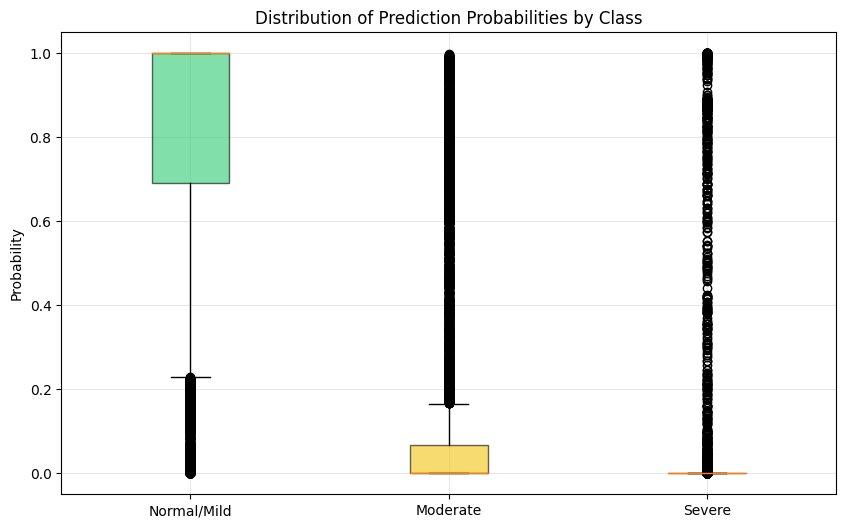


2. Confidence Heatmap


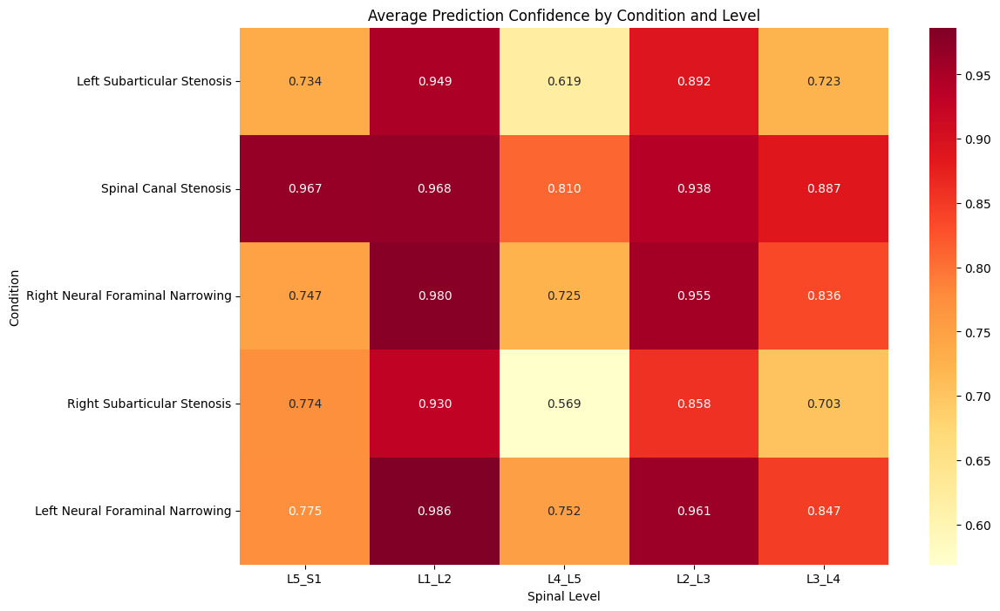


3. Severity Distribution


<Figure size 1200x600 with 0 Axes>

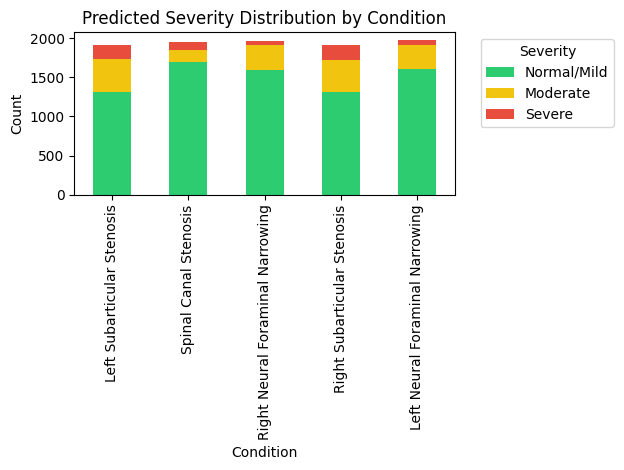


4. Confidence Histogram


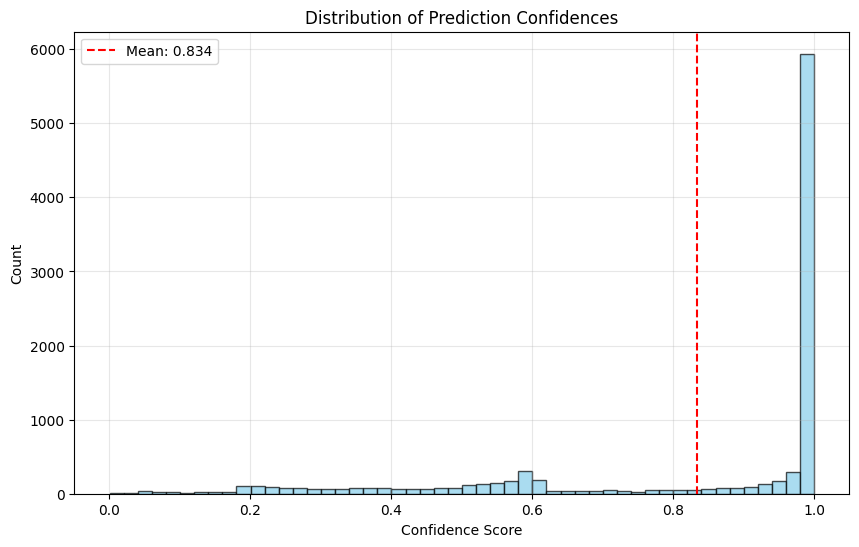


5. Prediction Adjustments


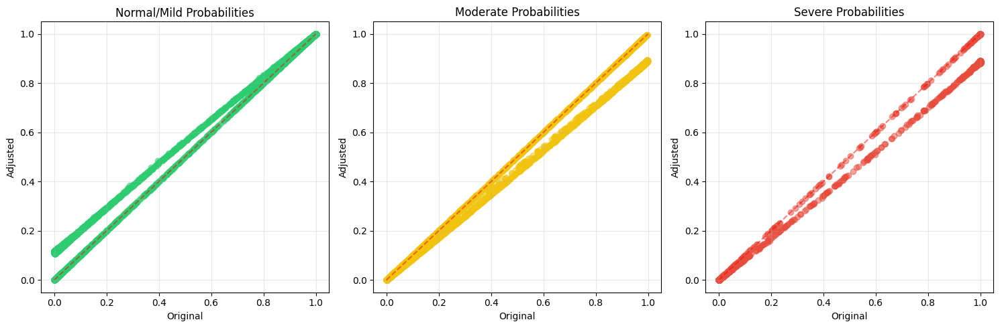


Visualization completed!


In [71]:
def main():
    """Example usage of visualization tools"""
    # Set device
    device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
    
    # Load model and create pipeline
    model = LumbarClassifier().to(device)
    model.load_state_dict(torch.load('best_model.pth')['model_state_dict'])
    pipeline = OptimizedPredictionPipeline(model, device)
    
    # Load validation data
    val_samples = load_processed_data('/kaggle/working/val_processed.npy')
    val_dataset = LumbarSpineDataset(val_samples, augment=False)
    val_loader = DataLoader(val_dataset, batch_size=32, shuffle=False)
    
    # Generate visualizations
    visualize_predictions(pipeline, val_loader)#, save_path='/kaggle/working/visualizations')

if __name__ == "__main__":
    main()

# Sample Image Prediction

In [78]:
class ModifiedOptimizedPredictionPipeline:
    def __init__(self, classification_model, device):
        self.classification_model = classification_model
        self.device = device
        self.classification_model.eval()
        
        # Define maps
        self.condition_map = {
            'Spinal Canal Stenosis': 0,
            'Left Neural Foraminal Narrowing': 1,
            'Right Neural Foraminal Narrowing': 2,
            'Left Subarticular Stenosis': 3,
            'Right Subarticular Stenosis': 4
        }
        
        self.level_map = {
            'L1_L2': 0, 'L2_L3': 1, 'L3_L4': 2, 'L4_L5': 3, 'L5_S1': 4
        }
    
    def prepare_input_tensors(self, image, condition, level):
        """Prepare input tensors with correct dimensions"""
        # Image tensor
        if isinstance(image, np.ndarray):
            image = torch.from_numpy(image).float()
        if len(image.shape) == 3:  # (H, W, C)
            image = image.permute(2, 0, 1)  # (C, H, W)
        if len(image.shape) == 3:
            image = image.unsqueeze(0)  # (1, C, H, W)
        
        # Condition tensor
        condition_tensor = torch.zeros(1, len(self.condition_map))
        condition_tensor[0, self.condition_map[condition]] = 1
        
        # Level tensor
        level_tensor = torch.zeros(1, len(self.level_map))
        level_tensor[0, self.level_map[level]] = 1
        
        # Move to device
        image = image.to(self.device)
        condition_tensor = condition_tensor.to(self.device)
        level_tensor = level_tensor.to(self.device)
        
        return image, condition_tensor, level_tensor
    
    def predict(self, image, condition, level):
        """Make prediction with proper tensor handling"""
        with torch.no_grad():
            # Prepare inputs
            image_tensor, condition_tensor, level_tensor = self.prepare_input_tensors(
                image, condition, level
            )
            
            # Get predictions
            outputs = self.classification_model(image_tensor, condition_tensor, level_tensor)
            probabilities = F.softmax(outputs, dim=1)
            
            # Get prediction class and confidence
            pred_class = torch.argmax(probabilities, dim=1)[0]
            confidence = torch.max(probabilities, dim=1)[0][0]
            
            return {
                'probabilities': probabilities,
                'severity_prediction': pred_class,
                'confidence': confidence,
            }


In [79]:
def predict_preprocessed_samples(pipeline, preprocessed_path: str, num_samples: int = 5):
    """Make predictions on randomly selected samples"""
    # Load preprocessed data
    print("Loading preprocessed data...")
    preprocessed_data = np.load(preprocessed_path, allow_pickle=True).item()
    
    # Get random indices
    total_samples = len(preprocessed_data['images'])
    sample_indices = np.random.choice(total_samples, num_samples, replace=False)
    
    severity_classes = ['Normal/Mild', 'Moderate', 'Severe']
    colors = ['green', 'yellow', 'red']
    
    for idx in sample_indices:
        try:
            # Get sample data
            image = preprocessed_data['images'][idx]
            condition = preprocessed_data['conditions'][idx]
            level = preprocessed_data['levels'][idx]
            true_severity = preprocessed_data['severities'][idx]
            study_id = preprocessed_data['study_ids'][idx]
            
            print(f"\nProcessing Sample {idx} (Study ID: {study_id})")
            
            # Get prediction
            prediction = pipeline.predict(image, condition, level)
            
            # Plot results
            plt.figure(figsize=(10, 5))
            
            # Plot image
            plt.subplot(1, 2, 1)
            plt.imshow(image.squeeze(), cmap='gray')
            plt.title(f"Study ID: {study_id}\n{condition}\nLevel: {level}")
            plt.axis('off')
            
            # Plot prediction results
            plt.subplot(1, 2, 2)
            probs = prediction['probabilities'].squeeze().cpu().numpy()
            pred_class = prediction['severity_prediction'].item()
            confidence = prediction['confidence'].item()
            
            # Create bar plot
            bars = plt.bar(severity_classes, probs, color=colors, alpha=0.6)
            plt.ylim(0, 1)
            plt.title(f"Predictions\nTrue: {true_severity}\n" + 
                     f"Predicted: {severity_classes[pred_class]}\n" +
                     f"Confidence: {confidence:.2f}")
            
            # Add value labels on bars
            for bar in bars:
                height = bar.get_height()
                plt.text(bar.get_x() + bar.get_width()/2., height,
                        f'{height:.2f}',
                        ha='center', va='bottom')
            
            plt.tight_layout()
            plt.show()
            
            # Print detailed prediction information
            print("\nDetailed Prediction Information:")
            print(f"Condition: {condition}")
            print(f"Level: {level}")
            print(f"True Severity: {true_severity}")
            print(f"Predicted Severity: {severity_classes[pred_class]}")
            print(f"Confidence: {confidence:.4f}")
            print("\nClass Probabilities:")
            for cls, prob in zip(severity_classes, probs):
                print(f"{cls}: {prob:.4f}")
            print("-" * 50)
            
        except Exception as e:
            print(f"Error processing sample {idx}: {str(e)}")
            continue

Using device: cuda
Loading preprocessed data...

Processing Sample 1794 (Study ID: 801319011)


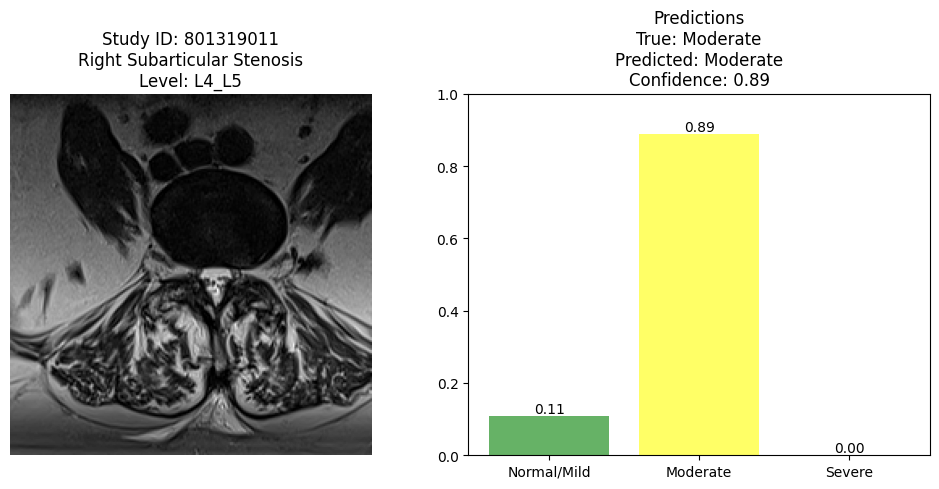


Detailed Prediction Information:
Condition: Right Subarticular Stenosis
Level: L4_L5
True Severity: Moderate
Predicted Severity: Moderate
Confidence: 0.8880

Class Probabilities:
Normal/Mild: 0.1100
Moderate: 0.8880
Severe: 0.0020
--------------------------------------------------

Processing Sample 7058 (Study ID: 3138242355)


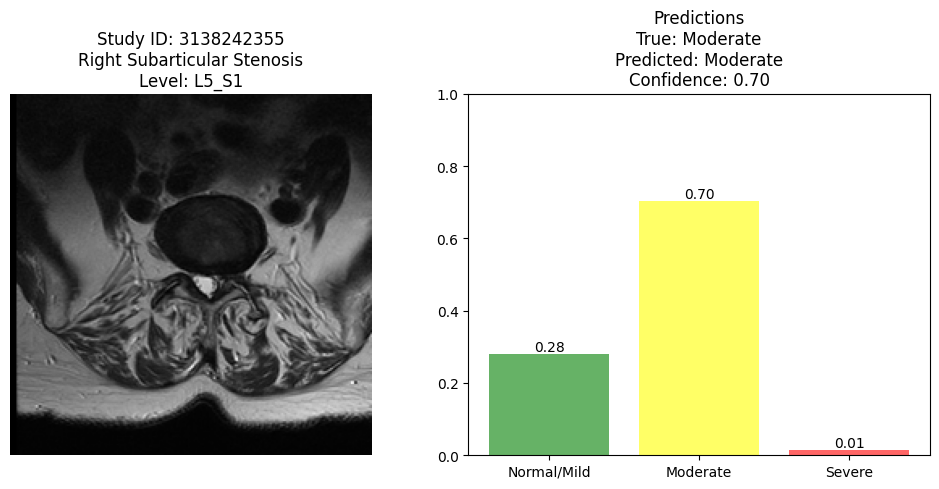


Detailed Prediction Information:
Condition: Right Subarticular Stenosis
Level: L5_S1
True Severity: Moderate
Predicted Severity: Moderate
Confidence: 0.7037

Class Probabilities:
Normal/Mild: 0.2814
Moderate: 0.7037
Severe: 0.0148
--------------------------------------------------

Processing Sample 7414 (Study ID: 3284652867)


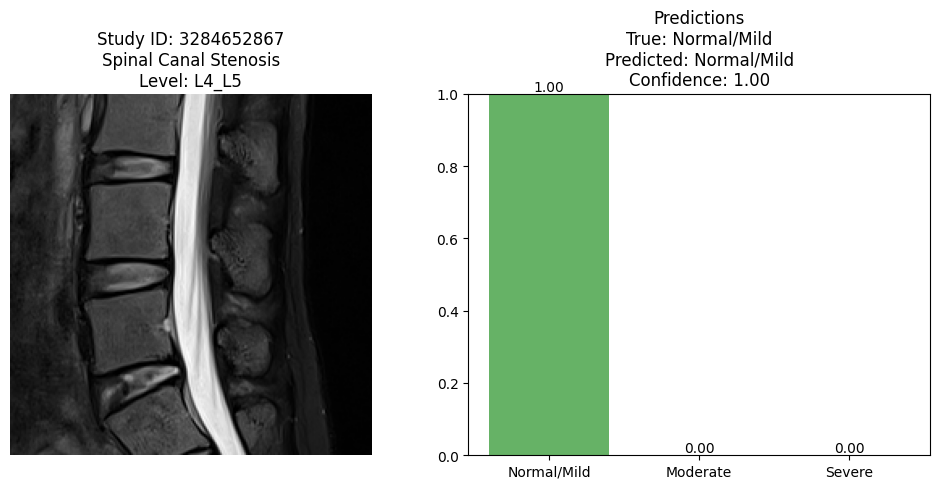


Detailed Prediction Information:
Condition: Spinal Canal Stenosis
Level: L4_L5
True Severity: Normal/Mild
Predicted Severity: Normal/Mild
Confidence: 1.0000

Class Probabilities:
Normal/Mild: 1.0000
Moderate: 0.0000
Severe: 0.0000
--------------------------------------------------

Processing Sample 3774 (Study ID: 1709574182)


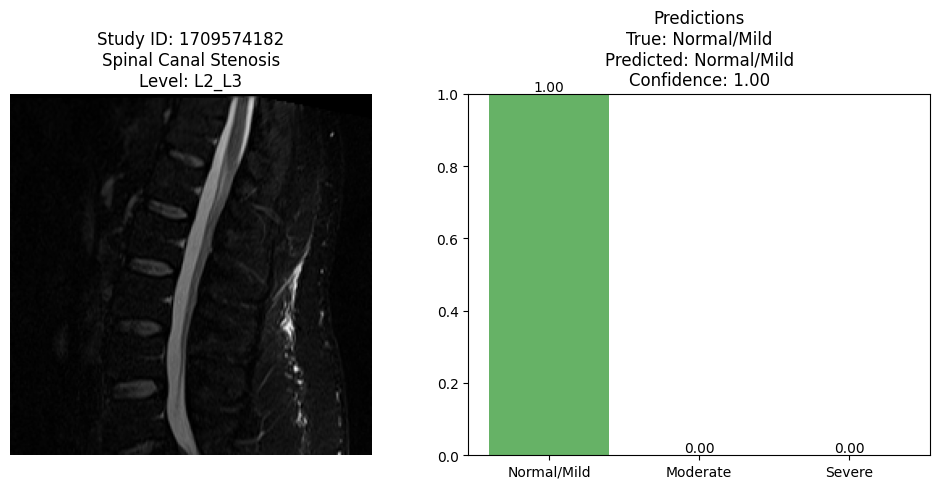


Detailed Prediction Information:
Condition: Spinal Canal Stenosis
Level: L2_L3
True Severity: Normal/Mild
Predicted Severity: Normal/Mild
Confidence: 1.0000

Class Probabilities:
Normal/Mild: 1.0000
Moderate: 0.0000
Severe: 0.0000
--------------------------------------------------

Processing Sample 704 (Study ID: 305152236)


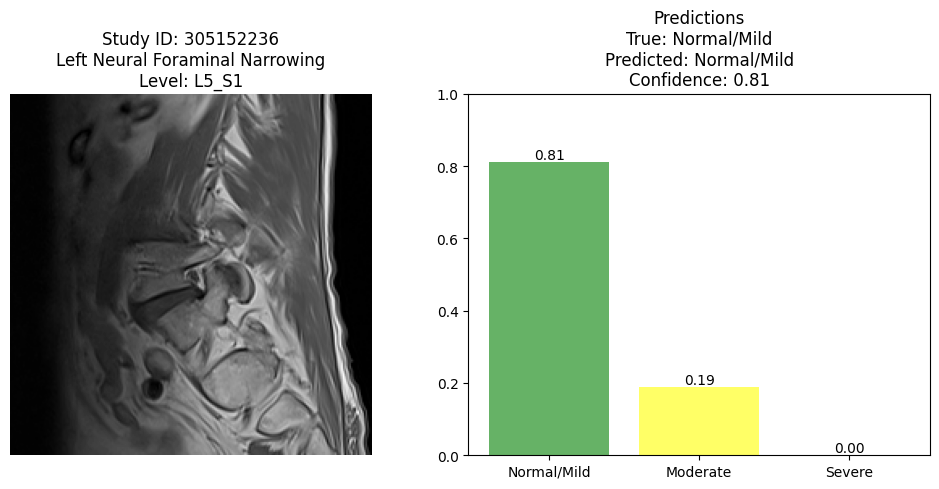


Detailed Prediction Information:
Condition: Left Neural Foraminal Narrowing
Level: L5_S1
True Severity: Normal/Mild
Predicted Severity: Normal/Mild
Confidence: 0.8111

Class Probabilities:
Normal/Mild: 0.8111
Moderate: 0.1884
Severe: 0.0006
--------------------------------------------------

Processing Sample 8826 (Study ID: 3884015124)


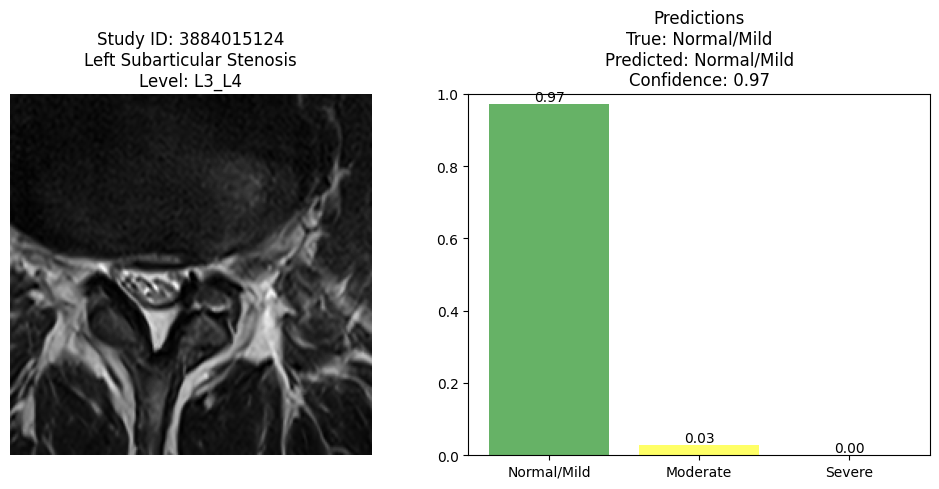


Detailed Prediction Information:
Condition: Left Subarticular Stenosis
Level: L3_L4
True Severity: Normal/Mild
Predicted Severity: Normal/Mild
Confidence: 0.9712

Class Probabilities:
Normal/Mild: 0.9712
Moderate: 0.0287
Severe: 0.0001
--------------------------------------------------

Processing Sample 5541 (Study ID: 2490850085)


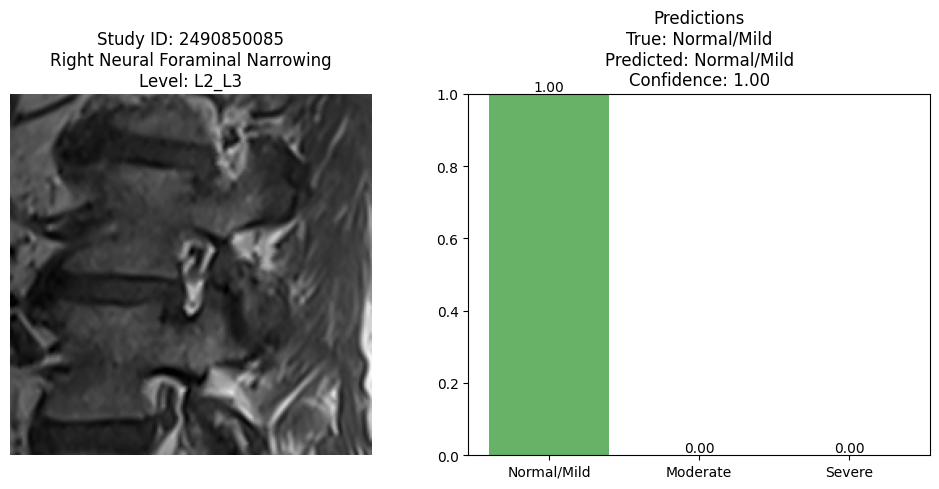


Detailed Prediction Information:
Condition: Right Neural Foraminal Narrowing
Level: L2_L3
True Severity: Normal/Mild
Predicted Severity: Normal/Mild
Confidence: 1.0000

Class Probabilities:
Normal/Mild: 1.0000
Moderate: 0.0000
Severe: 0.0000
--------------------------------------------------

Processing Sample 3104 (Study ID: 1395773918)


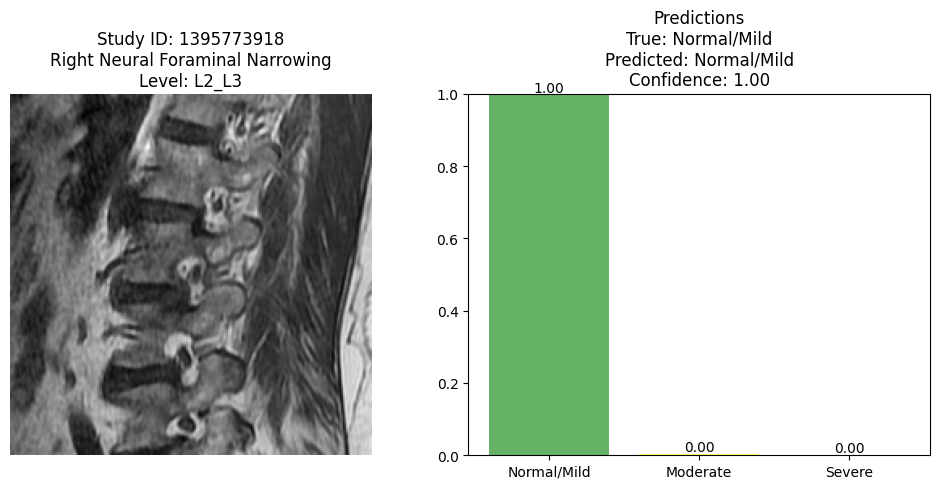


Detailed Prediction Information:
Condition: Right Neural Foraminal Narrowing
Level: L2_L3
True Severity: Normal/Mild
Predicted Severity: Normal/Mild
Confidence: 0.9968

Class Probabilities:
Normal/Mild: 0.9968
Moderate: 0.0032
Severe: 0.0000
--------------------------------------------------

Processing Sample 4429 (Study ID: 2008315239)


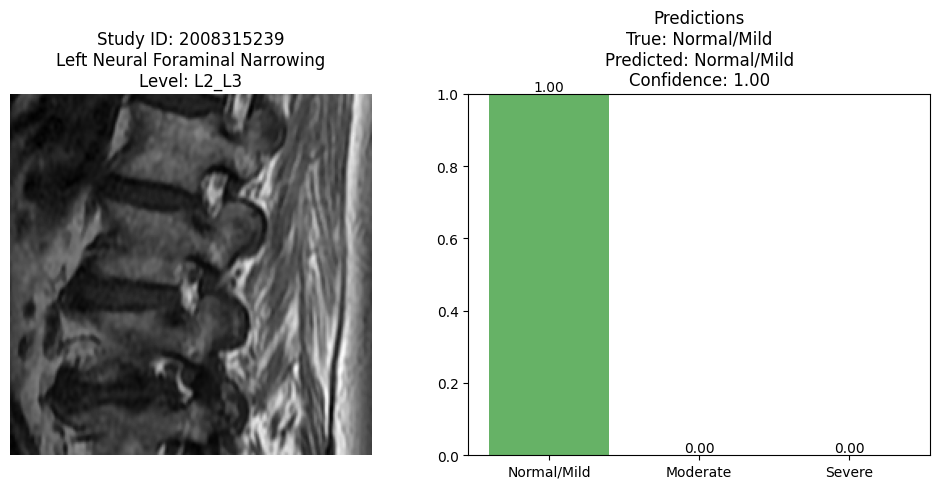


Detailed Prediction Information:
Condition: Left Neural Foraminal Narrowing
Level: L2_L3
True Severity: Normal/Mild
Predicted Severity: Normal/Mild
Confidence: 1.0000

Class Probabilities:
Normal/Mild: 1.0000
Moderate: 0.0000
Severe: 0.0000
--------------------------------------------------

Processing Sample 941 (Study ID: 408455883)


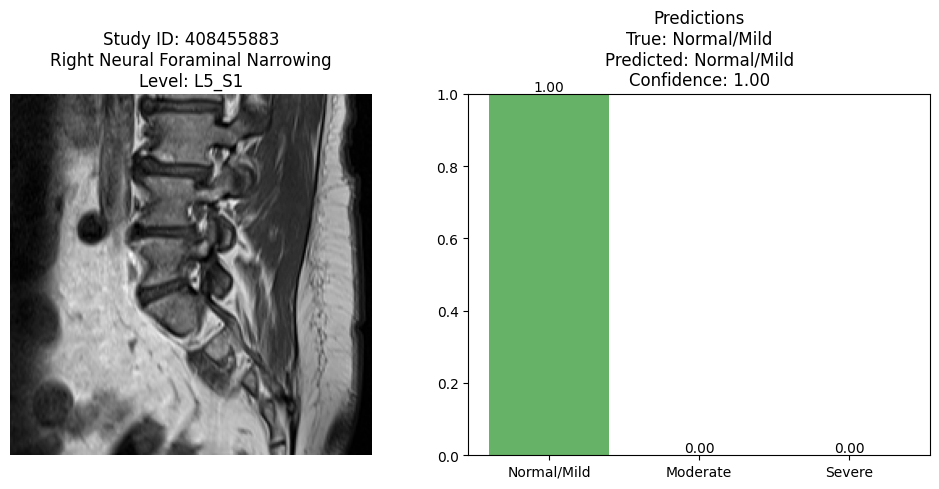


Detailed Prediction Information:
Condition: Right Neural Foraminal Narrowing
Level: L5_S1
True Severity: Normal/Mild
Predicted Severity: Normal/Mild
Confidence: 1.0000

Class Probabilities:
Normal/Mild: 1.0000
Moderate: 0.0000
Severe: 0.0000
--------------------------------------------------


In [83]:
def main():
    # Set device
    device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
    print(f"Using device: {device}")
    
    # Load the model
    model = LumbarClassifier().to(device)
    model.load_state_dict(torch.load('best_model.pth')['model_state_dict'])
    model.eval()
    
    # Create prediction pipeline
    pipeline = ModifiedOptimizedPredictionPipeline(model, device)
    
    # Make predictions on preprocessed samples
    predict_preprocessed_samples(
        pipeline,
        preprocessed_path='/kaggle/working/val_processed.npy',
        num_samples=10
    )

if __name__ == "__main__":
    main()

# Advanced Analysis

In [84]:
from sklearn.metrics import confusion_matrix

In [87]:
class AdvancedAnalysis:
    def __init__(self, pipeline, preprocessed_path: str):
        self.pipeline = pipeline
        self.preprocessed_data = np.load(preprocessed_path, allow_pickle=True).item()
        self.severity_classes = ['Normal/Mild', 'Moderate', 'Severe']
    
    def analyze_prediction_patterns(self, num_samples: int = 1000):
        """Perform statistical analysis of prediction patterns with error handling"""
        total_samples = len(self.preprocessed_data['images'])
        sample_indices = np.random.choice(total_samples, min(num_samples, total_samples), replace=False)
        
        results = {
            'condition_level_accuracy': defaultdict(lambda: defaultdict(list)),
            'confidence_scores': [],
            'true_vs_pred': [],
            'level_difficulty': defaultdict(list),
            'condition_difficulty': defaultdict(list)
        }
        
        print("Analyzing prediction patterns...")
        processed_samples = 0
        
        for idx in sample_indices:
            try:
                # Get sample data
                image = self.preprocessed_data['images'][idx]
                condition = self.preprocessed_data['conditions'][idx]
                level = self.preprocessed_data['levels'][idx]
                true_severity = self.preprocessed_data['severities'][idx]
                
                # Get prediction
                prediction = self.pipeline.predict(image, condition, level)
                pred_class = prediction['severity_prediction'].item()
                confidence = prediction['confidence'].item()
                
                # Store results
                results['confidence_scores'].append(confidence)
                results['true_vs_pred'].append((true_severity, self.severity_classes[pred_class]))
                results['condition_level_accuracy'][condition][level].append(
                    true_severity == self.severity_classes[pred_class]
                )
                results['level_difficulty'][level].append(confidence)
                results['condition_difficulty'][condition].append(confidence)
                
                processed_samples += 1
                if processed_samples % 100 == 0:
                    print(f"Processed {processed_samples}/{num_samples} samples...")
                
            except Exception as e:
                print(f"Error processing sample {idx}: {str(e)}")
                continue
        
        print(f"\nCompleted analysis of {processed_samples} samples")
        self._visualize_statistics(results)
        return results
    
    def _visualize_statistics(self, results: Dict):
        """Visualize statistical analysis results with fixed accuracy calculations"""
        # 1. Overall Confidence Distribution
        plt.figure(figsize=(15, 5))
        plt.subplot(1, 3, 1)
        sns.histplot(results['confidence_scores'], bins=30)
        plt.title('Confidence Score Distribution')
        plt.xlabel('Confidence')
        plt.ylabel('Count')
        
        # 2. Level-wise Accuracy
        level_acc = {}
        for level in set([l for d in results['condition_level_accuracy'].values() for l in d.keys()]):
            level_values = []
            for cond_data in results['condition_level_accuracy'].values():
                if level in cond_data:
                    level_values.extend(cond_data[level])
            if level_values:
                level_acc[level] = np.mean(level_values)
        
        plt.subplot(1, 3, 2)
        if level_acc:
            plt.bar(level_acc.keys(), level_acc.values())
            plt.title('Accuracy by Spinal Level')
            plt.xticks(rotation=45)
        
        # 3. Condition-wise Accuracy
        condition_acc = {}
        for condition, level_data in results['condition_level_accuracy'].items():
            condition_values = []
            for level_list in level_data.values():
                condition_values.extend(level_list)
            if condition_values:
                condition_acc[condition] = np.mean(condition_values)
        
        plt.subplot(1, 3, 3)
        if condition_acc:
            plt.bar(range(len(condition_acc)), condition_acc.values())
            plt.xticks(range(len(condition_acc)), 
                      [c.split()[0] for c in condition_acc.keys()], 
                      rotation=45)
            plt.title('Accuracy by Condition')
        
        plt.tight_layout()
        plt.show()
        
        # 4. Confusion Matrix
        true_labels = [t for t, _ in results['true_vs_pred']]
        pred_labels = [p for _, p in results['true_vs_pred']]
        
        cm = confusion_matrix(true_labels, pred_labels, 
                            labels=self.severity_classes)
        plt.figure(figsize=(8, 6))
        sns.heatmap(cm, annot=True, fmt='d', 
                   xticklabels=self.severity_classes,
                   yticklabels=self.severity_classes)
        plt.title('Confusion Matrix')
        plt.xlabel('Predicted')
        plt.ylabel('True')
        plt.show()
        
        # Print summary statistics
        print("\nSummary Statistics:")
        print(f"Total Samples Analyzed: {len(results['confidence_scores'])}")
        print(f"Average Confidence: {np.mean(results['confidence_scores']):.4f}")
        print(f"Confidence Std Dev: {np.std(results['confidence_scores']):.4f}")
        
        print("\nAccuracy by Level:")
        for level, acc in level_acc.items():
            print(f"{level}: {acc:.4f}")
        
        print("\nAccuracy by Condition:")
        for cond, acc in condition_acc.items():
            print(f"{cond}: {acc:.4f}")
            
        # Add detailed analysis for challenging cases
        print("\nDetailed Analysis of Challenging Cases:")
        correct_predictions = sum(t == p for t, p in results['true_vs_pred'])
        total_predictions = len(results['true_vs_pred'])
        overall_accuracy = correct_predictions / total_predictions if total_predictions > 0 else 0
        
        print(f"Overall Accuracy: {overall_accuracy:.4f}")
        
        # Analyze accuracy by severity
        severity_acc = defaultdict(lambda: {'correct': 0, 'total': 0})
        for true, pred in results['true_vs_pred']:
            severity_acc[true]['total'] += 1
            if true == pred:
                severity_acc[true]['correct'] += 1
        
        print("\nAccuracy by Severity:")
        for severity, counts in severity_acc.items():
            acc = counts['correct'] / counts['total'] if counts['total'] > 0 else 0
            print(f"{severity}: {acc:.4f} ({counts['correct']}/{counts['total']})")
    
    def analyze_challenging_cases(self, num_cases: int = 5):
        """Find and analyze particularly challenging cases"""
        print("\nAnalyzing challenging cases...")
        challenging_cases = []
        
        # Define challenging criteria
        challenging_criteria = [
            ('L4_L5', 'Severe'),    # Known difficult level with severe cases
            ('L5_S1', 'Moderate'),  # Transition cases at difficult level
            ('L3_L4', 'Severe'),    # Higher level severe cases
            ('L4_L5', 'Moderate')   # Moderate cases at difficult level
        ]
        
        for criterion_level, criterion_severity in challenging_criteria:
            # Find matching cases
            for idx in range(len(self.preprocessed_data['images'])):
                if len(challenging_cases) >= num_cases:
                    break
                    
                level = self.preprocessed_data['levels'][idx]
                severity = self.preprocessed_data['severities'][idx]
                
                if level == criterion_level and severity == criterion_severity:
                    challenging_cases.append(idx)
        
        # Analyze challenging cases
        print(f"\nAnalyzing {len(challenging_cases)} challenging cases:")
        for idx in challenging_cases:
            image = self.preprocessed_data['images'][idx]
            condition = self.preprocessed_data['conditions'][idx]
            level = self.preprocessed_data['levels'][idx]
            true_severity = self.preprocessed_data['severities'][idx]
            
            # Get prediction
            prediction = self.pipeline.predict(image, condition, level)
            probs = prediction['probabilities'].squeeze().cpu().numpy()
            pred_class = prediction['severity_prediction'].item()
            confidence = prediction['confidence'].item()
            
            # Plot results
            plt.figure(figsize=(10, 5))
            
            # Plot image
            plt.subplot(1, 2, 1)
            plt.imshow(image.squeeze(), cmap='gray')
            plt.title(f"Challenging Case\n{condition}\nLevel: {level}")
            plt.axis('off')
            
            # Plot prediction probabilities
            plt.subplot(1, 2, 2)
            colors = ['green', 'yellow', 'red']
            bars = plt.bar(self.severity_classes, probs, color=colors, alpha=0.6)
            plt.ylim(0, 1)
            plt.title(f"Predictions\nTrue: {true_severity}\n" +
                     f"Predicted: {self.severity_classes[pred_class]}\n" +
                     f"Confidence: {confidence:.2f}")
            
            # Add value labels
            for bar in bars:
                height = bar.get_height()
                plt.text(bar.get_x() + bar.get_width()/2., height,
                        f'{height:.2f}',
                        ha='center', va='bottom')
            
            plt.tight_layout()
            plt.show()
            
            # Print analysis
            print(f"\nChallenging Case Analysis:")
            print(f"Condition: {condition}")
            print(f"Level: {level}")
            print(f"True Severity: {true_severity}")
            print(f"Predicted: {self.severity_classes[pred_class]}")
            print(f"Confidence: {confidence:.4f}")
            print("\nProbability Distribution:")
            for cls, prob in zip(self.severity_classes, probs):
                print(f"{cls}: {prob:.4f}")
            print("-" * 50)


Using device: cuda

Running Statistical Analysis...
Analyzing prediction patterns...
Processed 100/500 samples...
Processed 200/500 samples...
Processed 300/500 samples...
Processed 400/500 samples...
Processed 500/500 samples...

Completed analysis of 500 samples


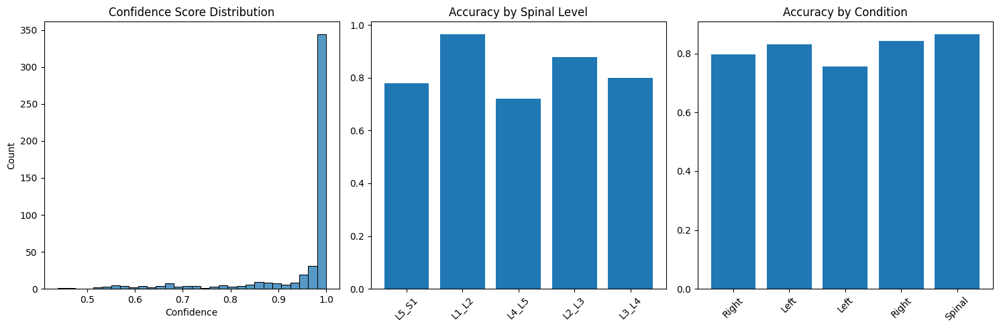

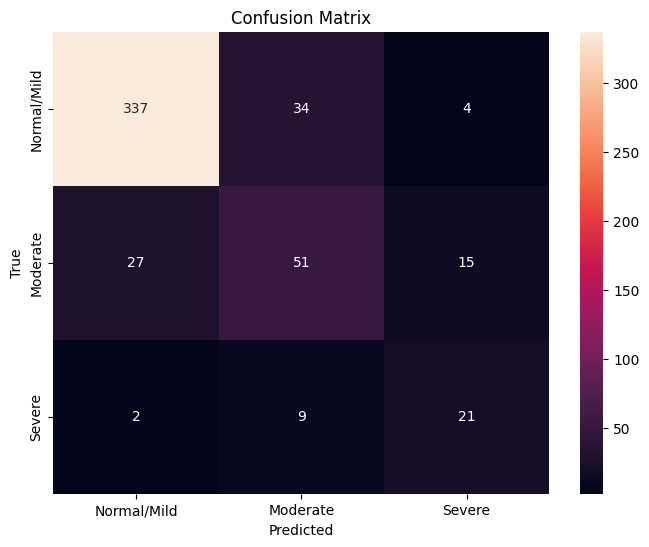


Summary Statistics:
Total Samples Analyzed: 500
Average Confidence: 0.9445
Confidence Std Dev: 0.1143

Accuracy by Level:
L5_S1: 0.7778
L1_L2: 0.9639
L4_L5: 0.7193
L2_L3: 0.8791
L3_L4: 0.7981

Accuracy by Condition:
Right Subarticular Stenosis: 0.7980
Left Neural Foraminal Narrowing: 0.8317
Left Subarticular Stenosis: 0.7573
Right Neural Foraminal Narrowing: 0.8426
Spinal Canal Stenosis: 0.8652

Detailed Analysis of Challenging Cases:
Overall Accuracy: 0.8180

Accuracy by Severity:
Normal/Mild: 0.8987 (337/375)
Moderate: 0.5484 (51/93)
Severe: 0.6562 (21/32)

Analyzing Challenging Cases...

Analyzing challenging cases...

Analyzing 5 challenging cases:


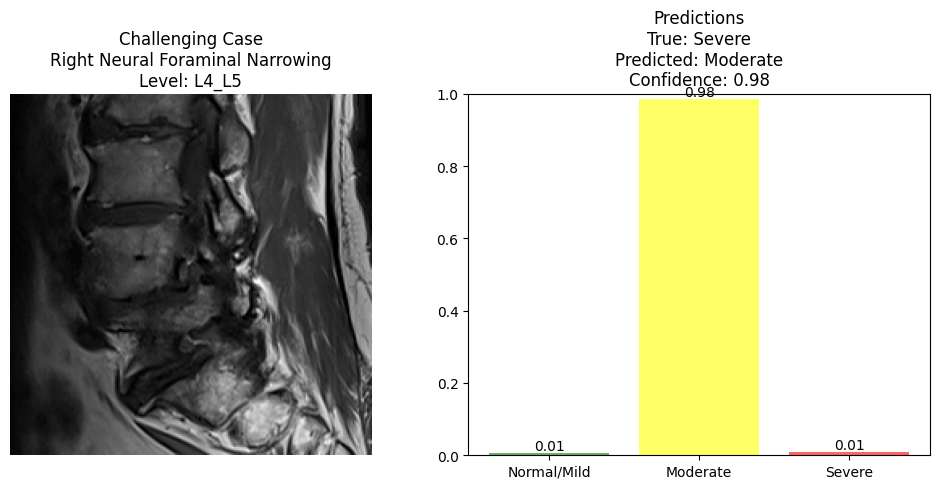


Challenging Case Analysis:
Condition: Right Neural Foraminal Narrowing
Level: L4_L5
True Severity: Severe
Predicted: Moderate
Confidence: 0.9841

Probability Distribution:
Normal/Mild: 0.0059
Moderate: 0.9841
Severe: 0.0100
--------------------------------------------------


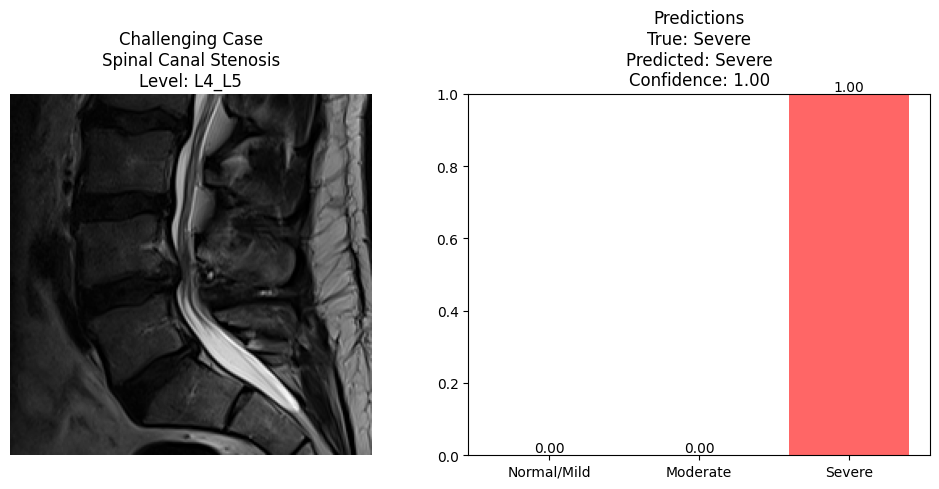


Challenging Case Analysis:
Condition: Spinal Canal Stenosis
Level: L4_L5
True Severity: Severe
Predicted: Severe
Confidence: 0.9985

Probability Distribution:
Normal/Mild: 0.0001
Moderate: 0.0014
Severe: 0.9985
--------------------------------------------------


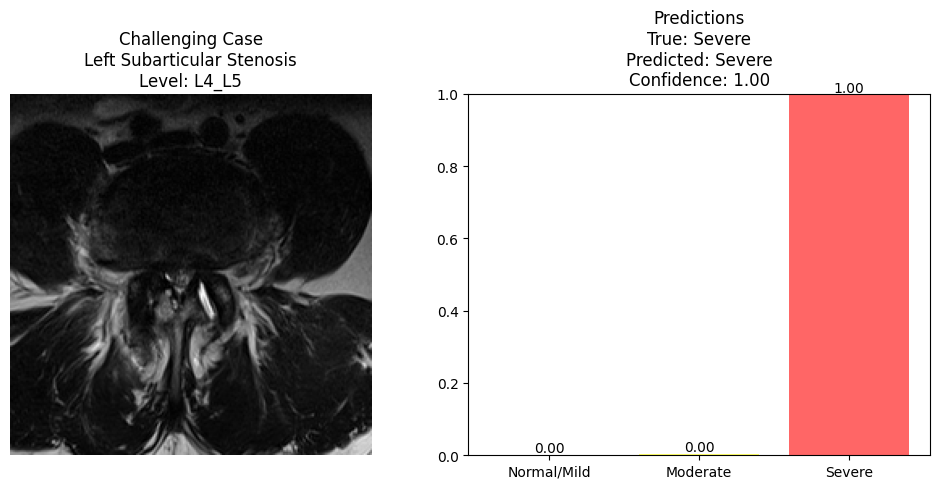


Challenging Case Analysis:
Condition: Left Subarticular Stenosis
Level: L4_L5
True Severity: Severe
Predicted: Severe
Confidence: 0.9958

Probability Distribution:
Normal/Mild: 0.0006
Moderate: 0.0036
Severe: 0.9958
--------------------------------------------------


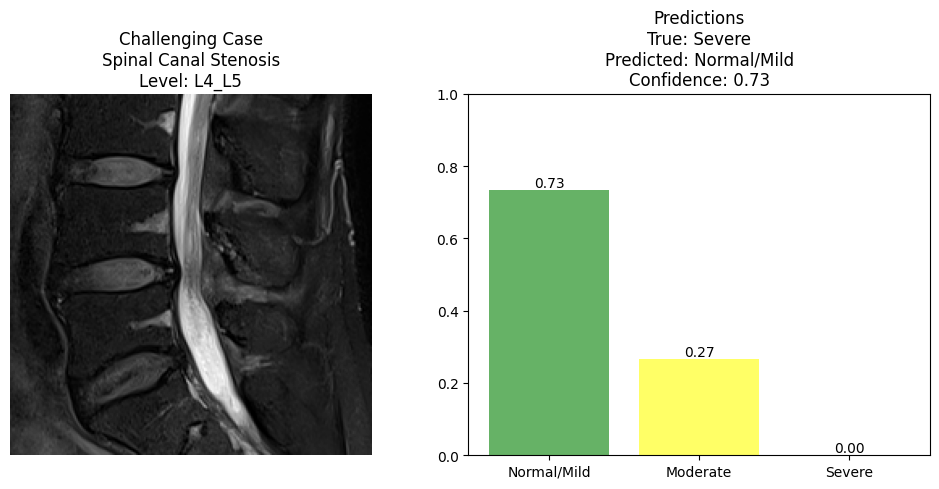


Challenging Case Analysis:
Condition: Spinal Canal Stenosis
Level: L4_L5
True Severity: Severe
Predicted: Normal/Mild
Confidence: 0.7331

Probability Distribution:
Normal/Mild: 0.7331
Moderate: 0.2651
Severe: 0.0017
--------------------------------------------------


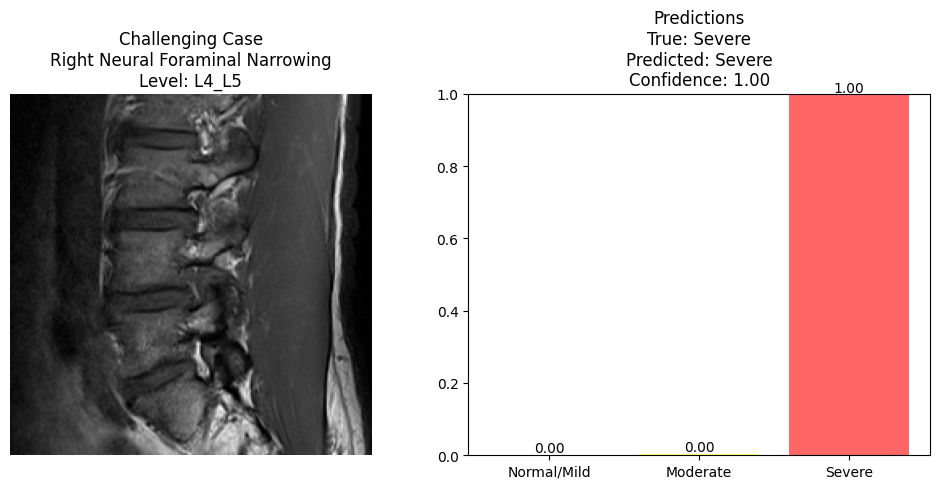


Challenging Case Analysis:
Condition: Right Neural Foraminal Narrowing
Level: L4_L5
True Severity: Severe
Predicted: Severe
Confidence: 0.9973

Probability Distribution:
Normal/Mild: 0.0001
Moderate: 0.0027
Severe: 0.9973
--------------------------------------------------


In [88]:
def main():
    # Set device
    device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
    print(f"Using device: {device}")
    
    # Load model and create pipeline
    model = LumbarClassifier().to(device)
    model.load_state_dict(torch.load('best_model.pth')['model_state_dict'])
    model.eval()
    
    pipeline = ModifiedOptimizedPredictionPipeline(model, device)
    
    # Create analyzer
    analyzer = AdvancedAnalysis(
        pipeline=pipeline,
        preprocessed_path='/kaggle/working/val_processed.npy'
    )
    
    # Run statistical analysis
    print("\nRunning Statistical Analysis...")
    stats_results = analyzer.analyze_prediction_patterns(num_samples=500)
    
    # Analyze challenging cases
    print("\nAnalyzing Challenging Cases...")
    analyzer.analyze_challenging_cases(num_cases=5)

if __name__ == "__main__":
    main()

Overall Model Performance:

* Overall Accuracy: 81.80%
* High Average Confidence: 0.9445 (94.45%)
* Reasonable Confidence Std Dev: 0.1143

Level-wise Performance (from best to worst):
* L1_L2: 96.39%   (Best - Upper level)
* L2_L3: 87.91%   (Good - Upper level)
* L3_L4: 79.81%   (Moderate)
* L5_S1: 77.78%   (Challenging)
* L4_L5: 71.93%   (Most challenging)

Condition-wise Performance:
* Spinal Canal Stenosis:          86.52% (Best)
* Right Neural Foraminal:         84.26%
* Left Neural Foraminal:          83.17%
* Right Subarticular Stenosis:    79.80%
* Left Subarticular Stenosis:     75.73% (Most challenging)

Severity-wise Performance:
* Normal/Mild: 89.87% (337/375 cases)
* Severe:      65.62% (21/32 cases)
* Moderate:    54.84% (51/93 cases)

Challenging Cases Analysis:
a) Successful Severe Predictions:

Case 2: Spinal Canal Stenosis (L4_L5)
* Confidence: 0.9985
* Very clear prediction

Case 3: Left Subarticular Stenosis (L4_L5)
* Confidence: 0.9958
* Strong prediction

Case 5: Right Neural Foraminal (L4_L5)
* Confidence: 0.9973
* Excellent prediction

b) Misclassifications:

Case 1: Right Neural Foraminal (L4_L5)
* True: Severe, Predicted: Moderate
* High confidence but wrong (0.9841)

Case 4: Spinal Canal Stenosis (L4_L5)
* True: Severe, Predicted: Normal/Mild
* Lower confidence (0.7331)

Key Insights:

Strong Points:
* Excellent at Normal/Mild cases (89.87%)
* Very good at upper levels (L1_L2, L2_L3)
* High confidence in predictions

Areas for Improvement:
* Moderate cases (54.84% accuracy)
* L4_L5 level performance (71.93%)
* Left Subarticular Stenosis (75.73%)

Critical Patterns:
* Model struggles with borderline cases
* High confidence doesn't always mean correct prediction
* L4_L5 level is consistently challenging

Recommendations:

Model Improvements:
* Focus on better moderate case detection
* Add more attention to L4_L5 level cases
* Consider ensemble approach for borderline cases

Clinical Application:
* High confidence in normal/mild cases
* Double-check high-confidence predictions at L4_L5
* Use confidence scores for decision support
